In [0]:
import pandas as pd
import numpy as np
import cv2
import os
import imutils
from PIL import Image
import keras
from keras import Sequential, losses, optimizers
from keras.layers import Dense, Conv2D, MaxPool2D, Average, Flatten, Dropout, Activation
from keras.utils import to_categorical, plot_model,vis_utils
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from keras.callbacks import TensorBoard, EarlyStopping
from keras.preprocessing.image import img_to_array
from skimage import io
import imutils
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from google.colab import files
from google.colab import drive
import glob
import pywt
from scipy import signal
import ecg_plot
drive.mount('/content/gdrive')

Using TensorFlow backend.


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
class DataModel:
    """
            DataModel
            not used currently in the program.
    """
    def __init__(self):
        self.items_labels = None
        self.images = []
        self.curated_data = {}
    def add_image(self, image_array):
        self.images.append(image_array)
    def add_labels(self, df):
        self.item_labels = df
    def add_curated_data(self, image, emotion):
        self.curated_data['segment'] = image #Array from csv of each segment
        self.curated_data['label'] = label #Label
        self.curated_data['scalogram'] =scaledImage #scalogram of each segment

def load_data(number_of_items=20):
    """
        number_of_items -> Number of items to return
        returns the data in a dictionary of images and labels.
    """
    path = "gdrive/My Drive/CMPE295B/csv_segmented_individual"
    data = [] 
    curated_data = {"segments":[], "label":[], "scalogram":[]}
    for subject_name in os.listdir(path)[:number_of_items]:
        # At the start of the iteration build a data model
        #data_model = DataModel()
        if subject_name == ".DS_Store":
            continue
        print ("Going through subject:" + subject_name)
        base=os.path.basename(path+"/"+subject_name)
        labelData=os.path.splitext(base)[0]
        print(labelData)
        for items in os.listdir(path+"/"+subject_name):
          #print (items)
          if items == ".DS_Store":
            continue
          else:
            try:
              if items.endswith(".csv"):
                df1=np.genfromtxt(path+"/"+subject_name+"/"+items, delimiter=',')
                #print(type(df1))
                #-----------------------To show Segment plot. Comment scalogram plt---
                #plt.plot(df1)
                #plt.show()
                #-----------------------------------------------
                widths = np.arange(1, 31)
                im1=df1
                cwtmatr, freqs = pywt.cwt(im1, widths, 'gaus1')
                plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto', 
                vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  # doctest: +SKIP
                #-------------To display scalogram------------
                #plt.show() # doctest: +SKIP
                #-----------------------------------------------
                plt.savefig(path+"/"+subject_name+"/"+"plot.png") 
                image1=cv2.imread(path+"/"+subject_name+"/"+"plot.png")
                #-------To display saved png image------------------------
                plt.imshow(image1)
                plt.show()
                #------------------------------------------------------
                print(type(image1))

              curated_data['segments'].append(df1)
              curated_data['scalogram'].append(image1)
              curated_data['label'].append(labelData)
              #print(df1)
            except:
              df = None                    
        #data.append(data_model) # Save all the data

    return curated_data


In [0]:
pip install ecg_plot

Going through subject:person107
person107
I got here 1
I got here 2


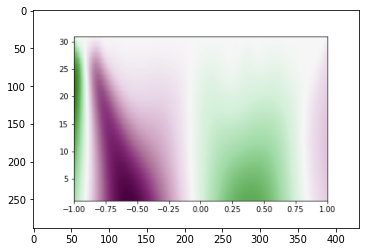

<class 'numpy.ndarray'>
I got here 1
I got here 2


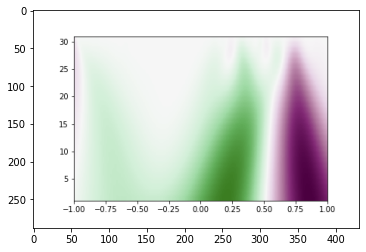

<class 'numpy.ndarray'>
I got here 1
I got here 2


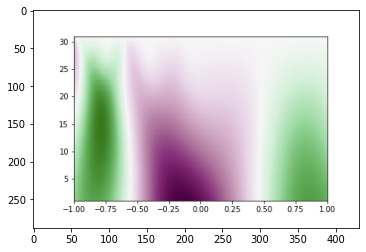

<class 'numpy.ndarray'>
I got here 1
I got here 2


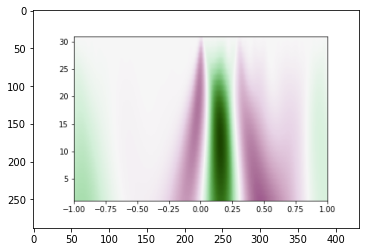

<class 'numpy.ndarray'>
I got here 1
I got here 2


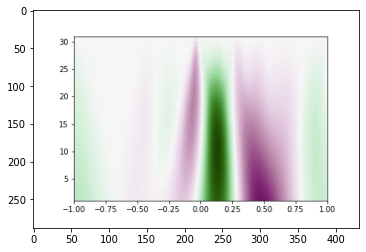

<class 'numpy.ndarray'>
I got here 1
I got here 2


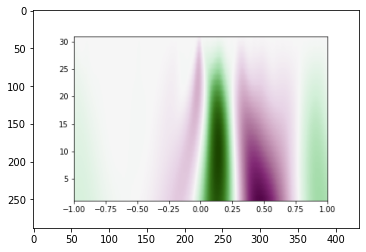

<class 'numpy.ndarray'>
I got here 1
I got here 2


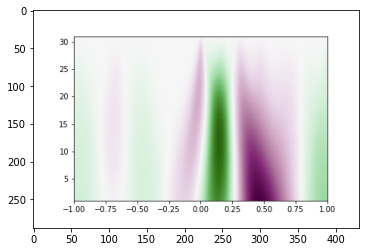

<class 'numpy.ndarray'>
I got here 1
I got here 2


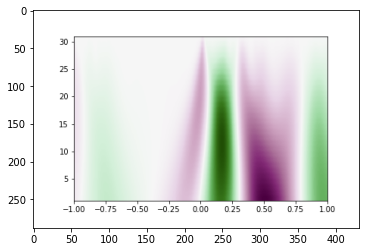

<class 'numpy.ndarray'>
I got here 1
I got here 2


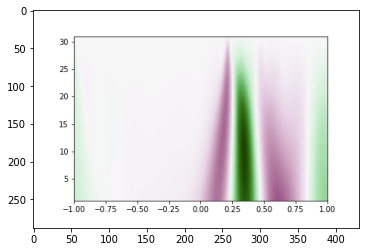

<class 'numpy.ndarray'>
I got here 1
I got here 2


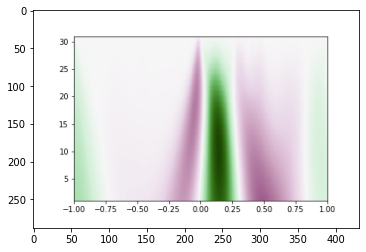

<class 'numpy.ndarray'>
I got here 1
I got here 2


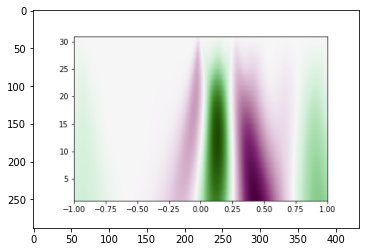

<class 'numpy.ndarray'>
I got here 1
I got here 2


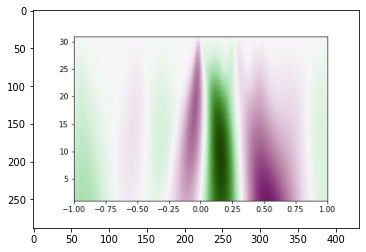

<class 'numpy.ndarray'>
I got here 1
I got here 2


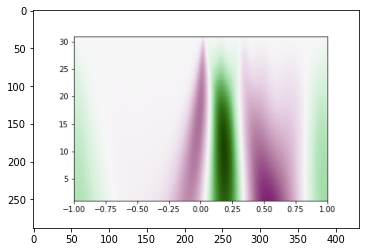

<class 'numpy.ndarray'>
I got here 1
I got here 2


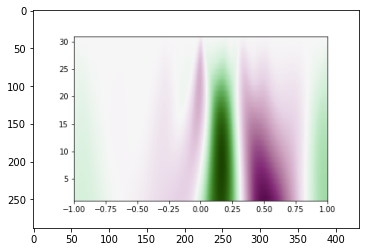

<class 'numpy.ndarray'>
I got here 1
I got here 2


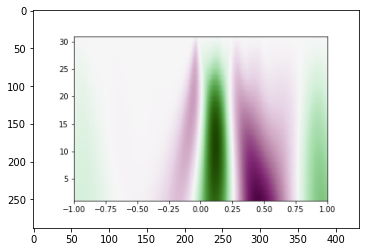

<class 'numpy.ndarray'>
I got here 1
I got here 2


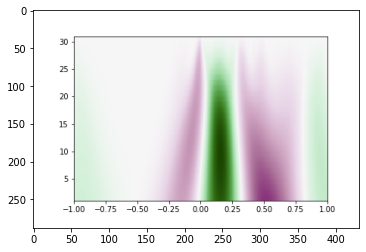

<class 'numpy.ndarray'>
I got here 1
I got here 2


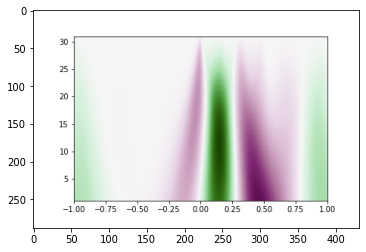

<class 'numpy.ndarray'>
I got here 1
I got here 2


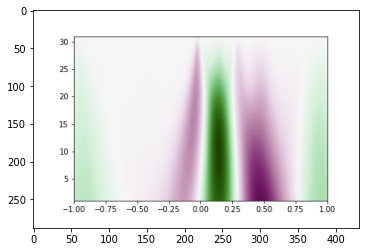

<class 'numpy.ndarray'>
I got here 1
I got here 2


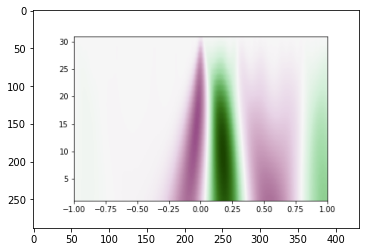

<class 'numpy.ndarray'>
I got here 1
I got here 2


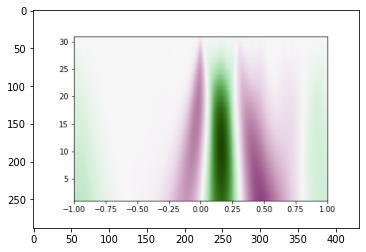

<class 'numpy.ndarray'>
I got here 1
I got here 2


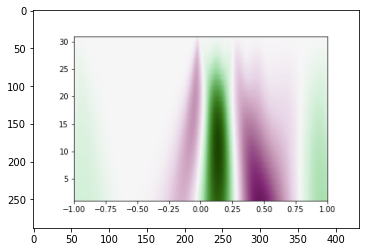

<class 'numpy.ndarray'>
I got here 1
I got here 2


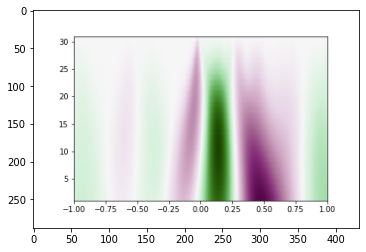

<class 'numpy.ndarray'>
I got here 1
I got here 2


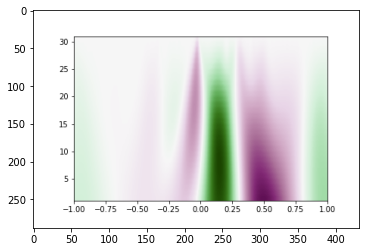

<class 'numpy.ndarray'>
I got here 1
I got here 2


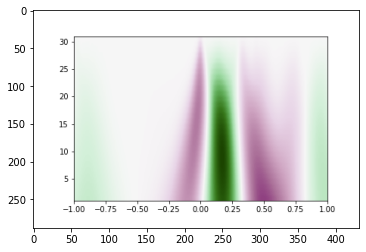

<class 'numpy.ndarray'>
I got here 1
I got here 2


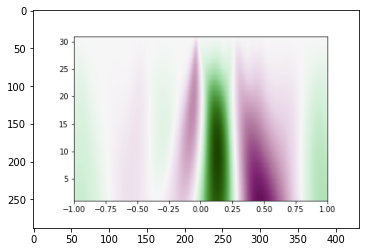

<class 'numpy.ndarray'>
I got here 1
I got here 2


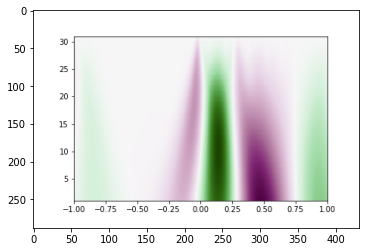

<class 'numpy.ndarray'>
I got here 1
I got here 2


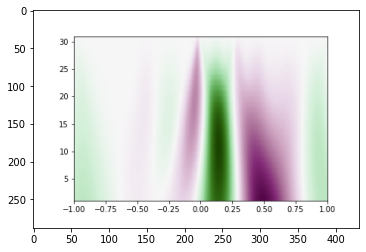

<class 'numpy.ndarray'>
I got here 1
I got here 2


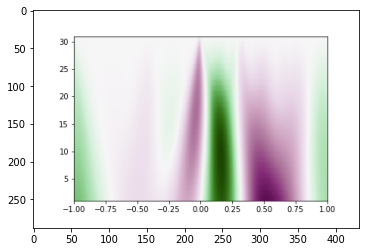

<class 'numpy.ndarray'>
I got here 1
I got here 2


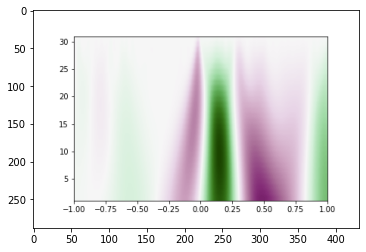

<class 'numpy.ndarray'>
I got here 1
I got here 2


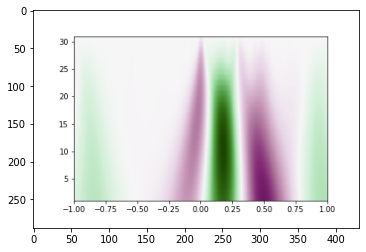

<class 'numpy.ndarray'>
I got here 1
I got here 2


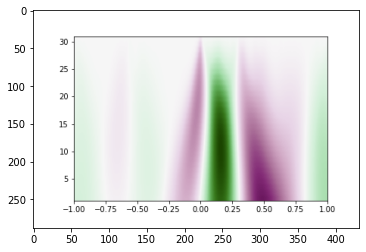

<class 'numpy.ndarray'>
I got here 1
I got here 2


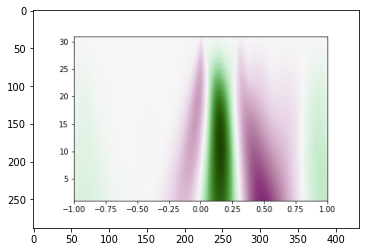

<class 'numpy.ndarray'>
I got here 1
I got here 2


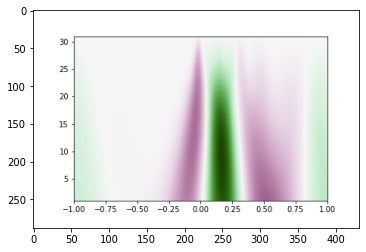

<class 'numpy.ndarray'>
I got here 1
I got here 2


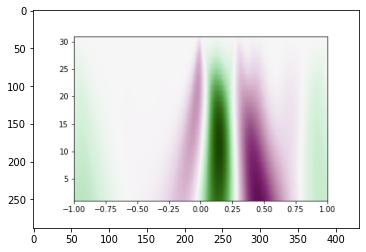

<class 'numpy.ndarray'>
I got here 1
I got here 2


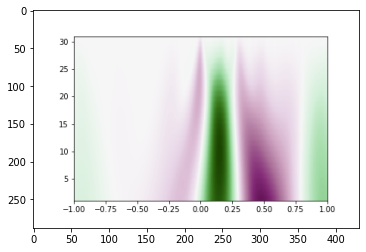

<class 'numpy.ndarray'>
I got here 1
I got here 2


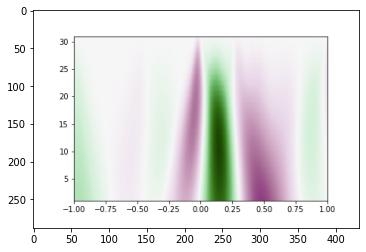

<class 'numpy.ndarray'>
I got here 1
I got here 2


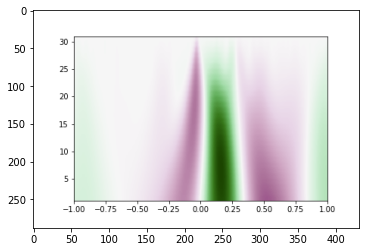

<class 'numpy.ndarray'>
I got here 1
I got here 2


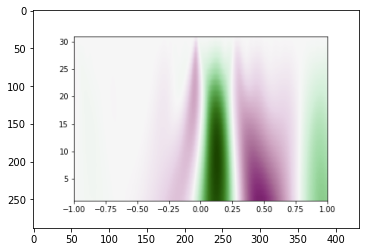

<class 'numpy.ndarray'>
I got here 1
I got here 2


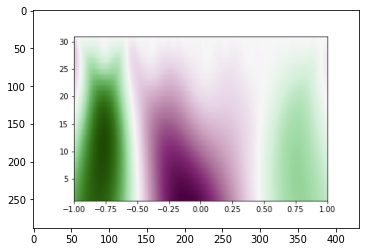

<class 'numpy.ndarray'>
I got here 1
I got here 2


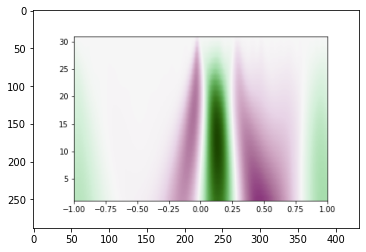

<class 'numpy.ndarray'>
I got here 1
I got here 2


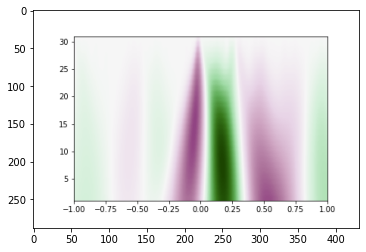

<class 'numpy.ndarray'>
I got here 1
I got here 2


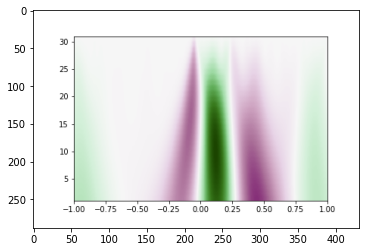

<class 'numpy.ndarray'>
I got here 1
I got here 2


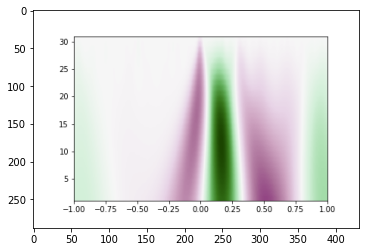

<class 'numpy.ndarray'>
I got here 1
I got here 2


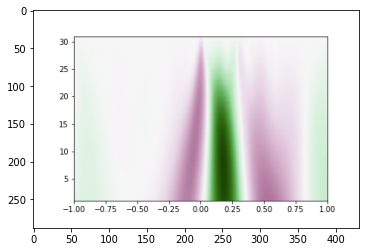

<class 'numpy.ndarray'>
I got here 1
I got here 2


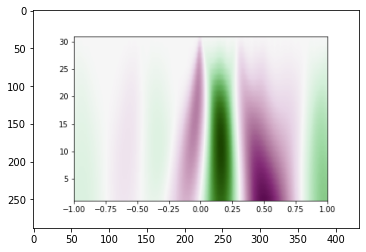

<class 'numpy.ndarray'>
I got here 1
I got here 2


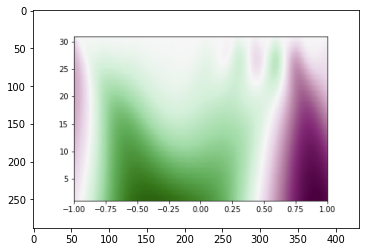

<class 'numpy.ndarray'>
I got here 1
I got here 2


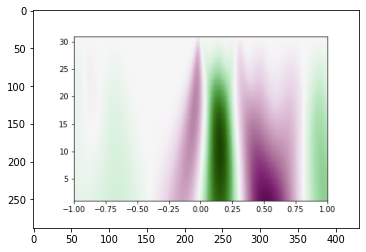

<class 'numpy.ndarray'>
I got here 1
I got here 2


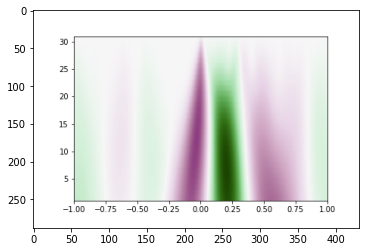

<class 'numpy.ndarray'>
I got here 1
I got here 2


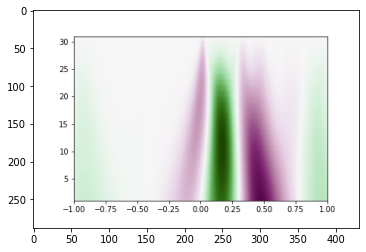

<class 'numpy.ndarray'>
I got here 1
I got here 2


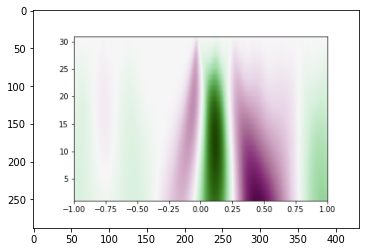

<class 'numpy.ndarray'>
I got here 1
I got here 2


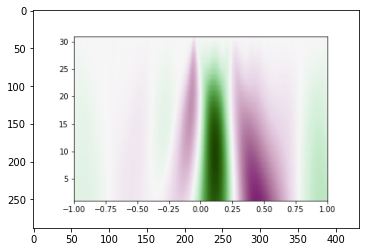

<class 'numpy.ndarray'>
I got here 1
I got here 2


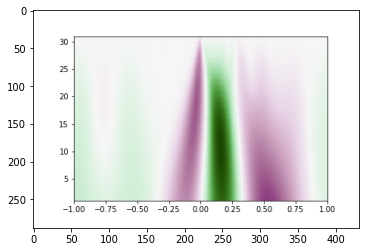

<class 'numpy.ndarray'>
I got here 1
I got here 2


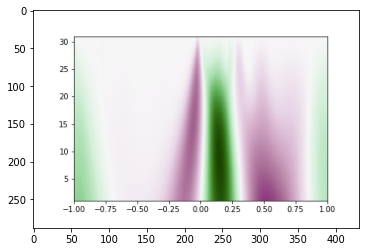

<class 'numpy.ndarray'>
I got here 1
I got here 2


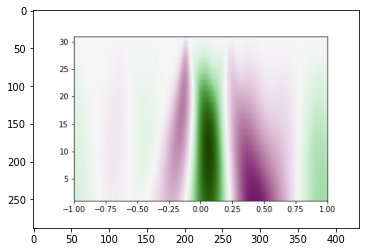

<class 'numpy.ndarray'>
I got here 1
I got here 2


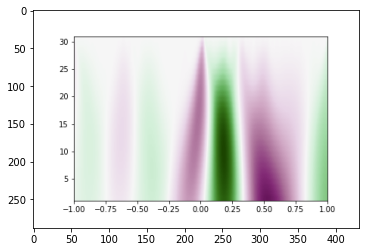

<class 'numpy.ndarray'>
I got here 1
I got here 2


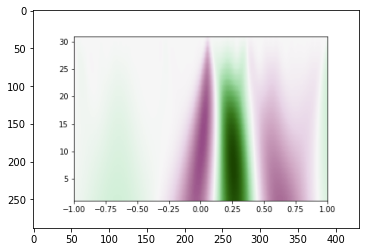

<class 'numpy.ndarray'>
I got here 1
I got here 2


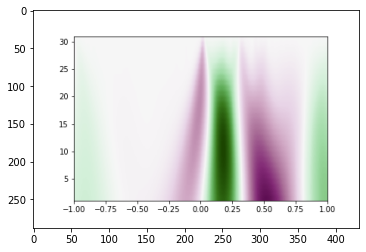

<class 'numpy.ndarray'>
I got here 1
I got here 2


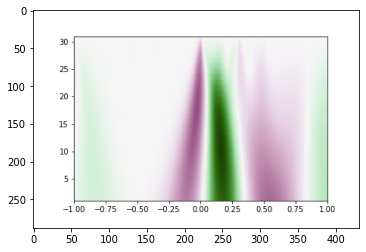

<class 'numpy.ndarray'>
I got here 1
I got here 2


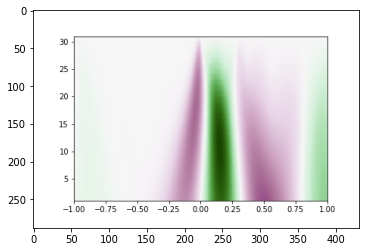

<class 'numpy.ndarray'>
I got here 1
I got here 2


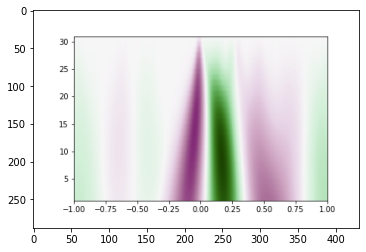

<class 'numpy.ndarray'>
I got here 1
I got here 2


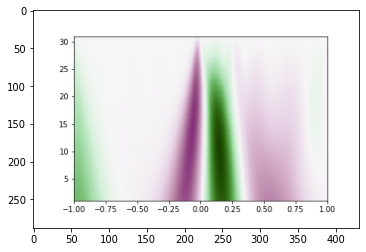

<class 'numpy.ndarray'>
I got here 1
I got here 2


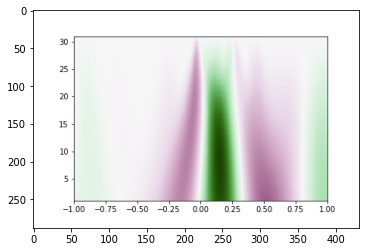

<class 'numpy.ndarray'>
I got here 1
I got here 2


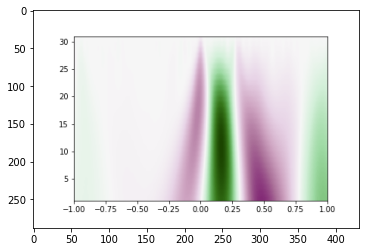

<class 'numpy.ndarray'>
I got here 1
I got here 2


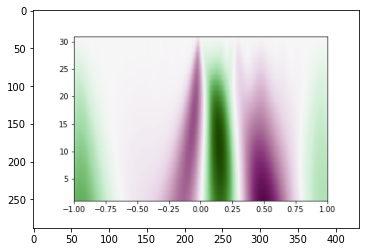

<class 'numpy.ndarray'>
I got here 1
I got here 2


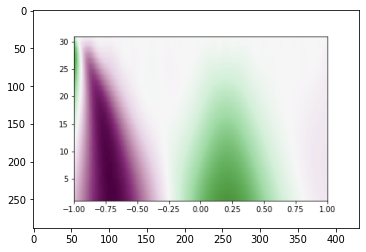

<class 'numpy.ndarray'>
I got here 1
I got here 2


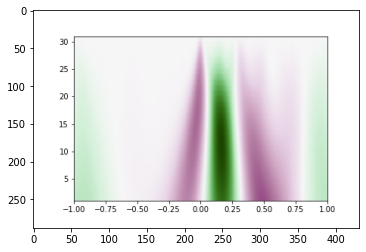

<class 'numpy.ndarray'>
I got here 1
I got here 2


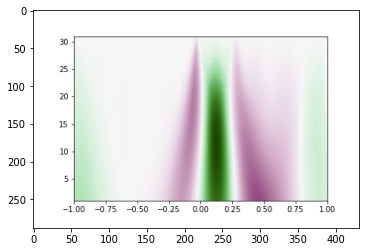

<class 'numpy.ndarray'>
I got here 1
I got here 2


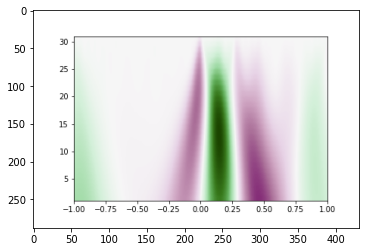

<class 'numpy.ndarray'>
I got here 1
I got here 2


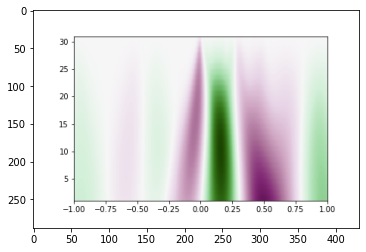

<class 'numpy.ndarray'>
I got here 1
I got here 2


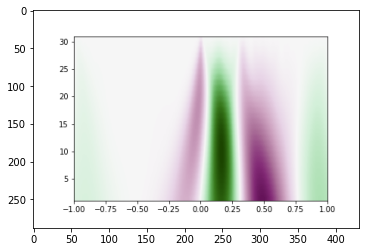

<class 'numpy.ndarray'>
I got here 1
I got here 2


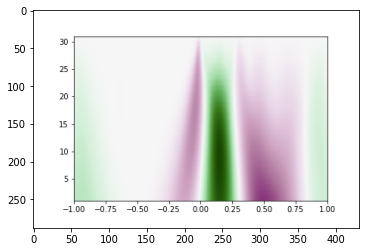

<class 'numpy.ndarray'>
I got here 1
I got here 2


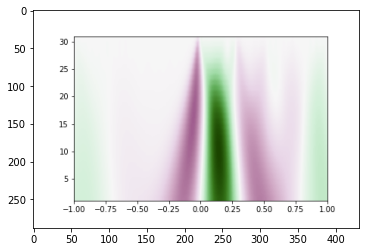

<class 'numpy.ndarray'>
I got here 1
I got here 2


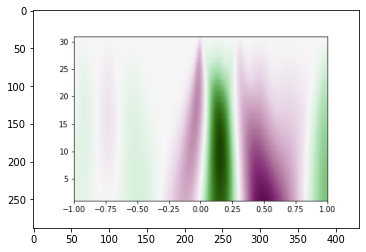

<class 'numpy.ndarray'>
I got here 1
I got here 2


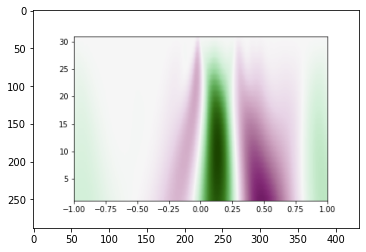

<class 'numpy.ndarray'>
I got here 1
I got here 2


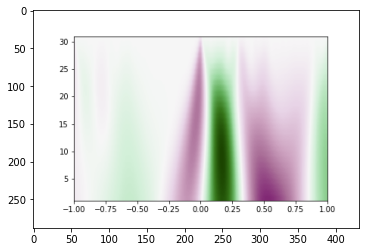

<class 'numpy.ndarray'>
I got here 1
I got here 2


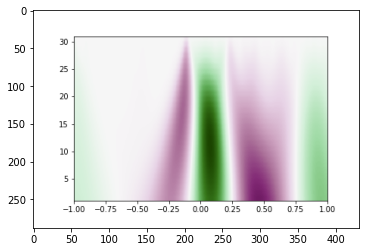

<class 'numpy.ndarray'>
I got here 1
I got here 2


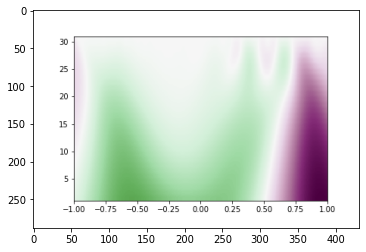

<class 'numpy.ndarray'>
I got here 1
I got here 2


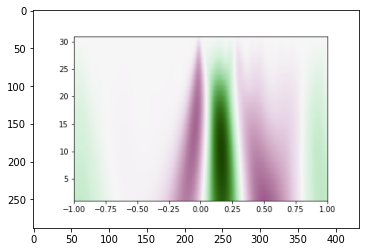

<class 'numpy.ndarray'>
I got here 1
I got here 2


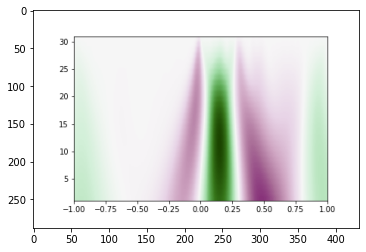

<class 'numpy.ndarray'>
I got here 1
I got here 2


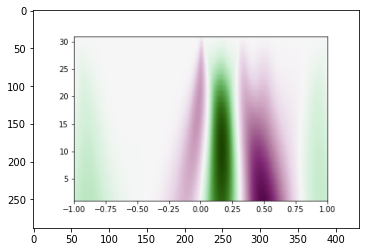

<class 'numpy.ndarray'>
I got here 1
I got here 2


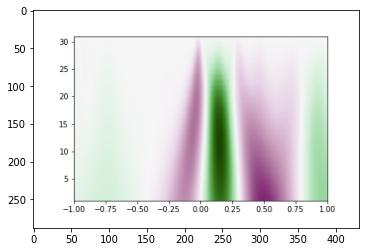

<class 'numpy.ndarray'>
I got here 1
I got here 2


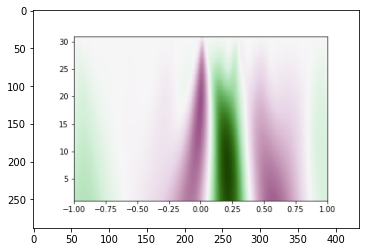

<class 'numpy.ndarray'>
I got here 1
I got here 2


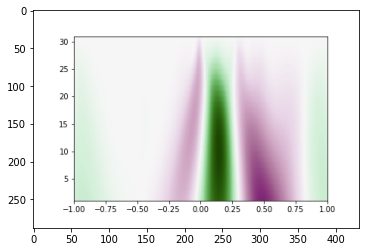

<class 'numpy.ndarray'>
I got here 1
I got here 2


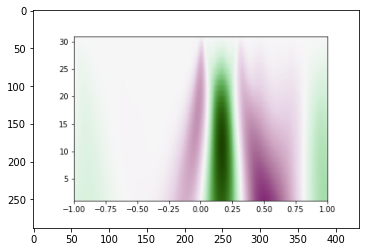

<class 'numpy.ndarray'>
I got here 1
I got here 2


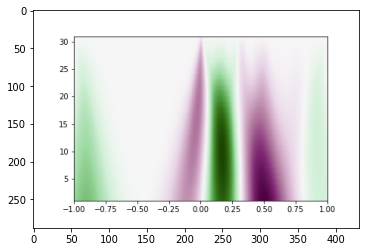

<class 'numpy.ndarray'>
I got here 1
I got here 2


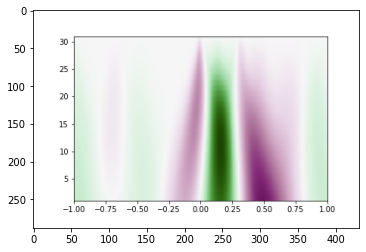

<class 'numpy.ndarray'>
I got here 1
I got here 2


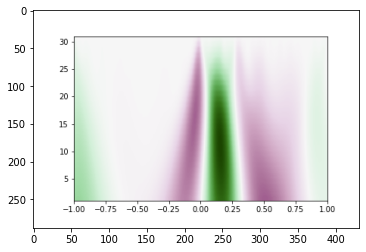

<class 'numpy.ndarray'>
I got here 1
I got here 2


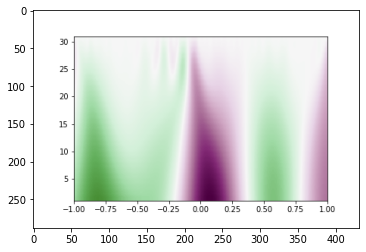

<class 'numpy.ndarray'>
I got here 1
I got here 2


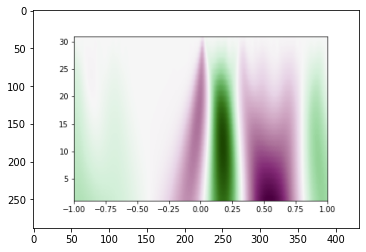

<class 'numpy.ndarray'>
I got here 1
I got here 2


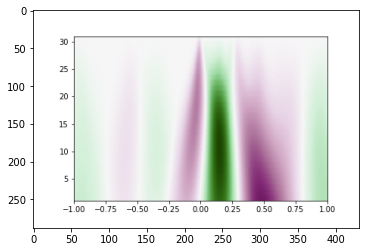

<class 'numpy.ndarray'>
I got here 1
I got here 2


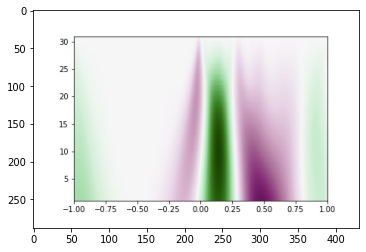

<class 'numpy.ndarray'>
I got here 1
I got here 2


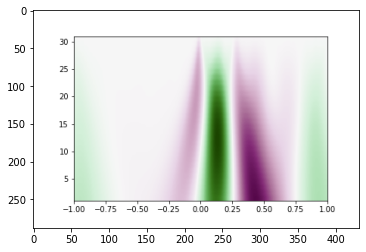

<class 'numpy.ndarray'>
I got here 1
I got here 2


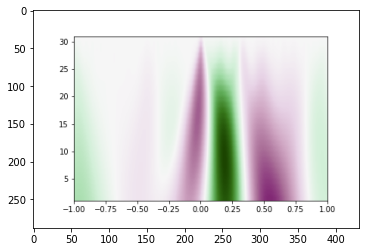

<class 'numpy.ndarray'>
I got here 1
I got here 2


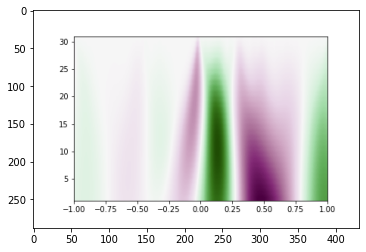

<class 'numpy.ndarray'>
I got here 1
I got here 2


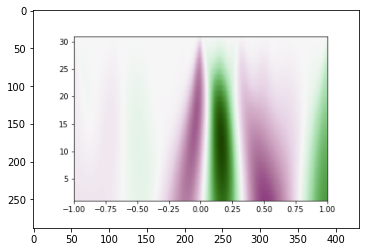

<class 'numpy.ndarray'>
I got here 1
I got here 2


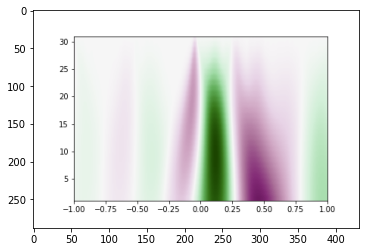

<class 'numpy.ndarray'>
I got here 1
I got here 2


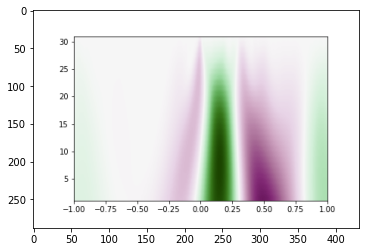

<class 'numpy.ndarray'>
I got here 1
I got here 2


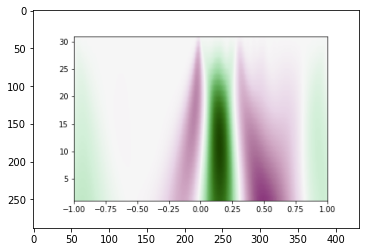

<class 'numpy.ndarray'>
I got here 1
I got here 2


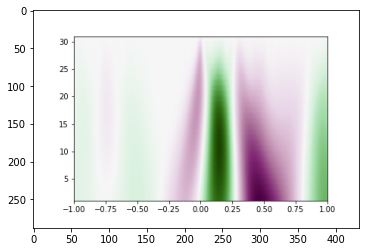

<class 'numpy.ndarray'>
I got here 1
I got here 2


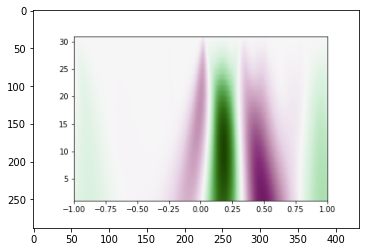

<class 'numpy.ndarray'>
I got here 1
I got here 2


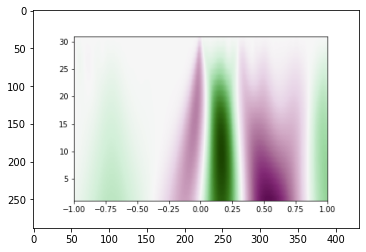

<class 'numpy.ndarray'>
I got here 1
I got here 2


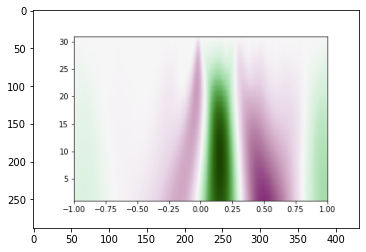

<class 'numpy.ndarray'>
I got here 1
I got here 2


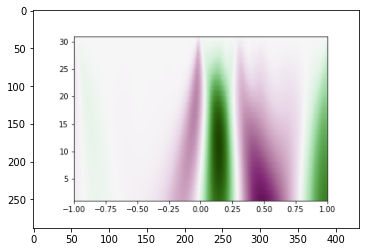

<class 'numpy.ndarray'>
I got here 1
I got here 2


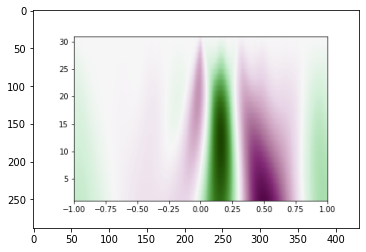

<class 'numpy.ndarray'>
I got here 1
I got here 2


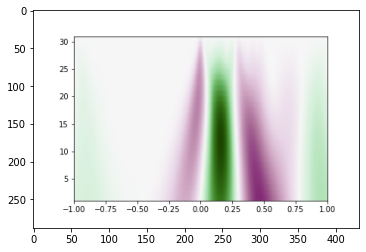

<class 'numpy.ndarray'>
I got here 1
I got here 2


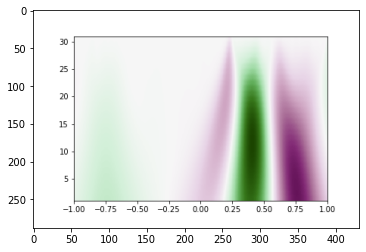

<class 'numpy.ndarray'>
I got here 1
I got here 2


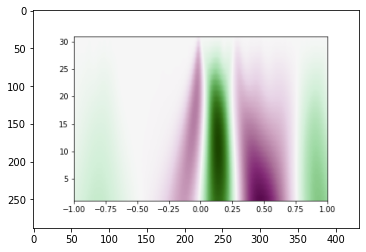

<class 'numpy.ndarray'>
I got here 1
I got here 2


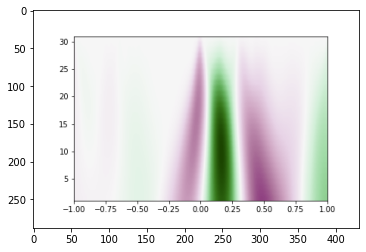

<class 'numpy.ndarray'>
I got here 1
I got here 2


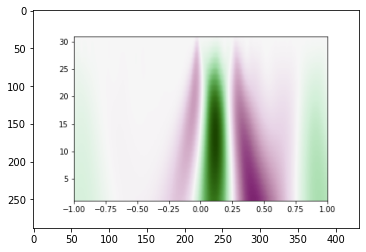

<class 'numpy.ndarray'>
I got here 1
I got here 2


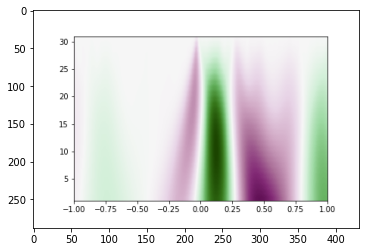

<class 'numpy.ndarray'>
I got here 1
I got here 2


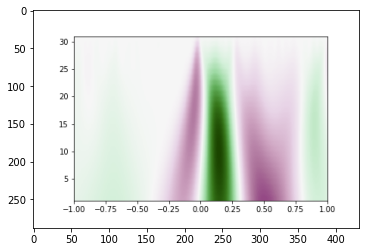

<class 'numpy.ndarray'>
I got here 1
I got here 2


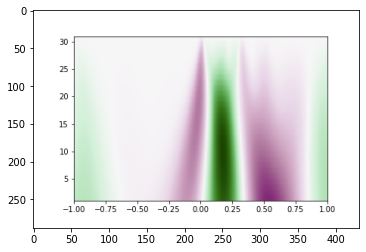

<class 'numpy.ndarray'>
I got here 1
I got here 2


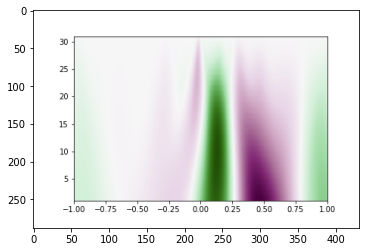

<class 'numpy.ndarray'>
I got here 1
I got here 2


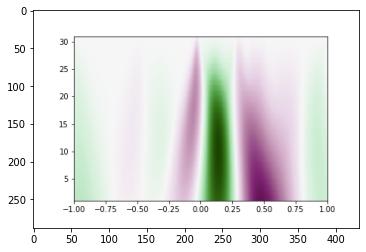

<class 'numpy.ndarray'>
I got here 1
I got here 2


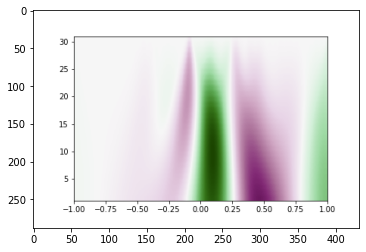

<class 'numpy.ndarray'>
I got here 1
I got here 2


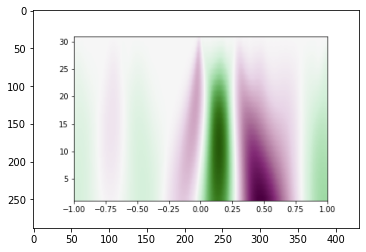

<class 'numpy.ndarray'>
I got here 1
I got here 2


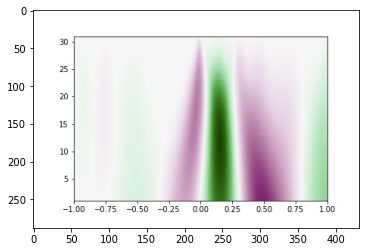

<class 'numpy.ndarray'>
I got here 1
I got here 2


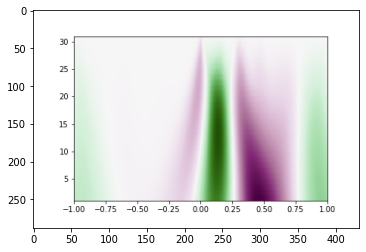

<class 'numpy.ndarray'>
I got here 1
I got here 2


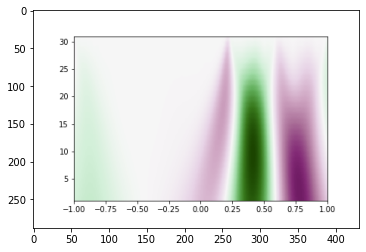

<class 'numpy.ndarray'>
I got here 1
I got here 2


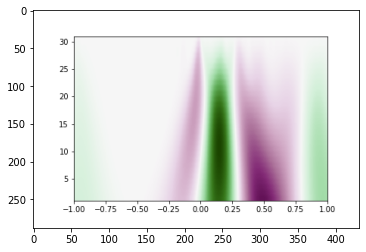

<class 'numpy.ndarray'>
I got here 1
I got here 2


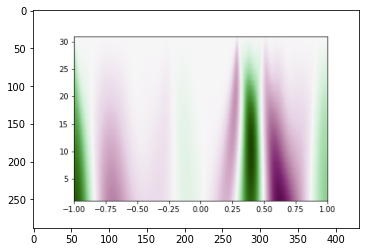

<class 'numpy.ndarray'>
I got here 1
I got here 2


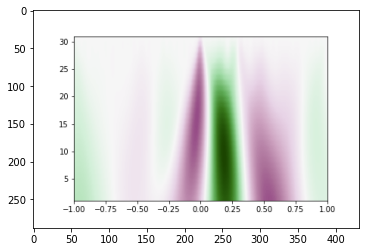

<class 'numpy.ndarray'>
I got here 1
I got here 2


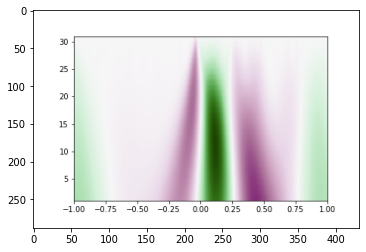

<class 'numpy.ndarray'>
I got here 1
I got here 2


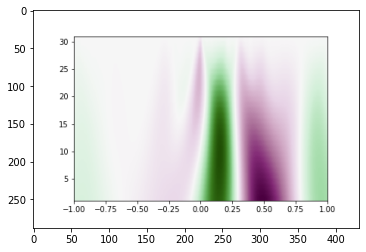

<class 'numpy.ndarray'>
I got here 1
I got here 2


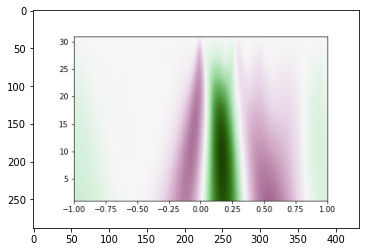

<class 'numpy.ndarray'>
I got here 1
I got here 2


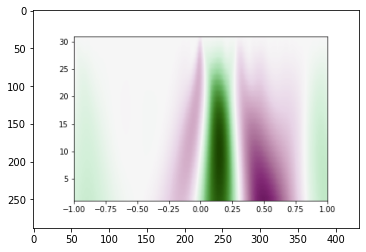

<class 'numpy.ndarray'>
I got here 1
I got here 2


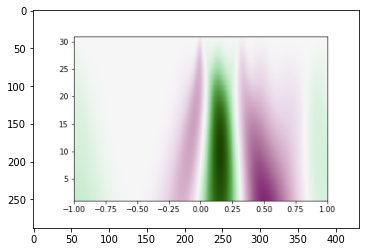

<class 'numpy.ndarray'>
I got here 1
I got here 2


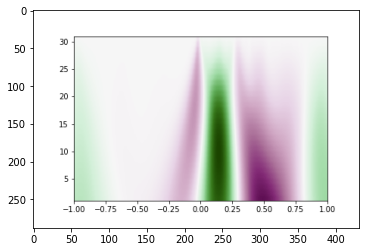

<class 'numpy.ndarray'>
I got here 1
I got here 2


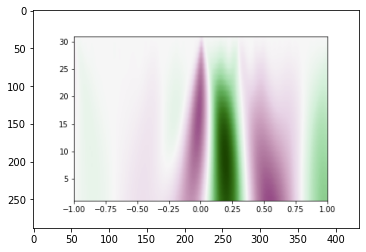

<class 'numpy.ndarray'>
I got here 1
I got here 2


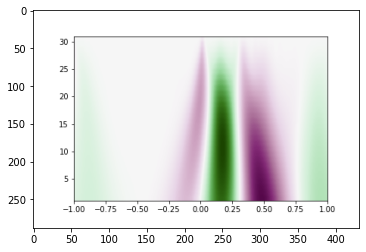

<class 'numpy.ndarray'>
I got here 1
I got here 2


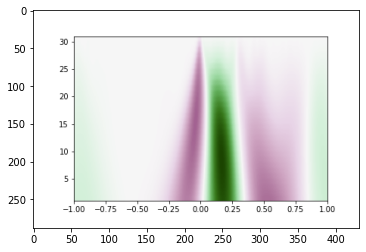

<class 'numpy.ndarray'>
I got here 1
I got here 2


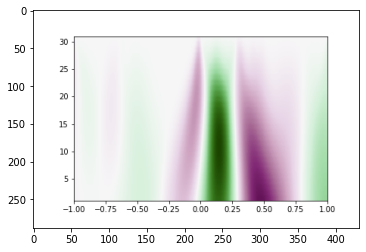

<class 'numpy.ndarray'>
I got here 1
I got here 2


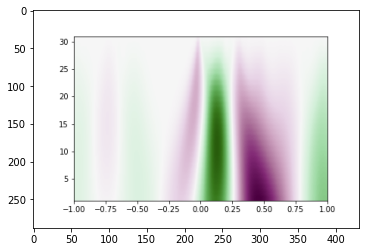

<class 'numpy.ndarray'>
I got here 1
I got here 2


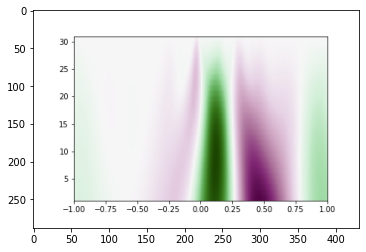

<class 'numpy.ndarray'>
I got here 1
I got here 2


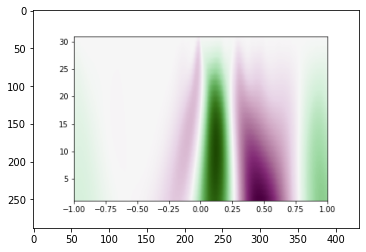

<class 'numpy.ndarray'>
I got here 1
I got here 2


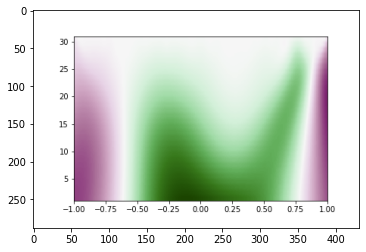

<class 'numpy.ndarray'>
I got here 1
I got here 2


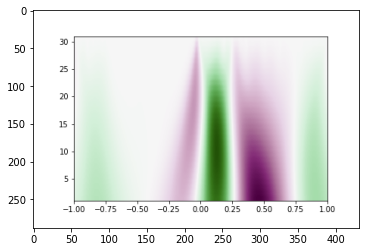

<class 'numpy.ndarray'>
I got here 1
I got here 2


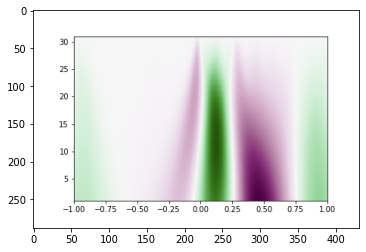

<class 'numpy.ndarray'>
I got here 1
I got here 2


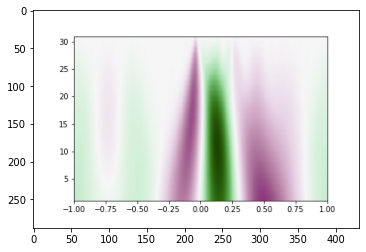

<class 'numpy.ndarray'>
I got here 1
I got here 2


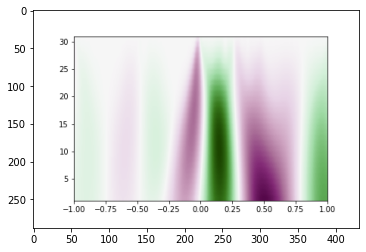

<class 'numpy.ndarray'>
I got here 1
I got here 2


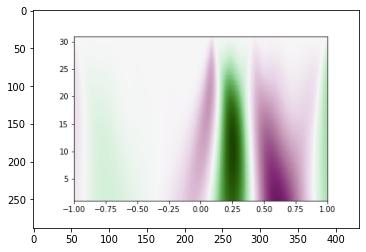

<class 'numpy.ndarray'>
I got here 1
I got here 2


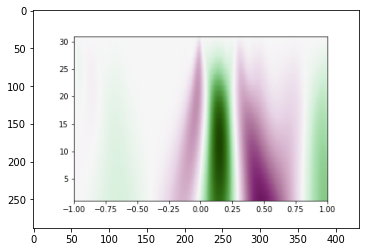

<class 'numpy.ndarray'>
I got here 1
I got here 2


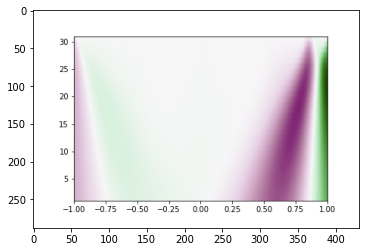

<class 'numpy.ndarray'>
I got here 1
I got here 2


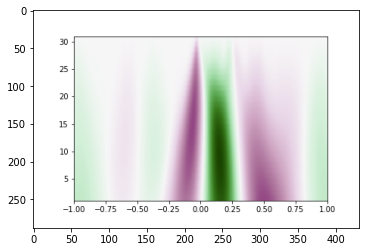

<class 'numpy.ndarray'>
I got here 1
I got here 2


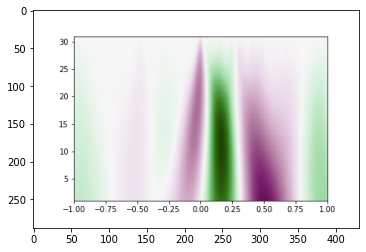

<class 'numpy.ndarray'>
I got here 1
I got here 2


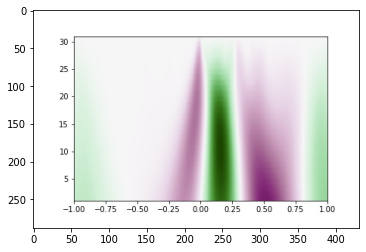

<class 'numpy.ndarray'>
I got here 1
I got here 2


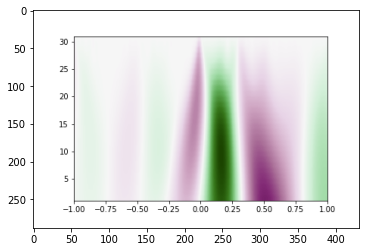

<class 'numpy.ndarray'>
I got here 1
I got here 2


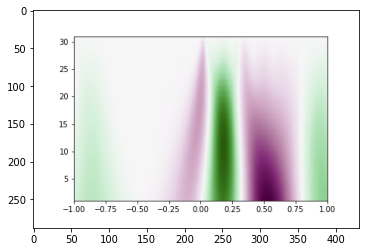

<class 'numpy.ndarray'>
I got here 1
I got here 2


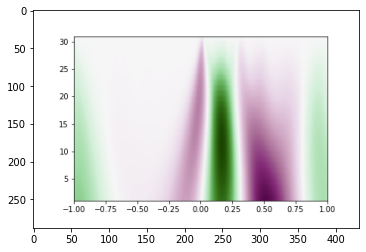

<class 'numpy.ndarray'>
I got here 1
I got here 2


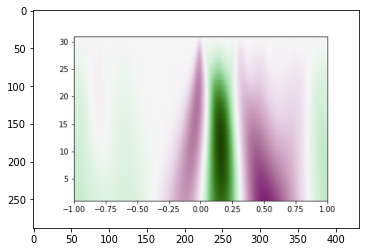

<class 'numpy.ndarray'>
I got here 1
I got here 2


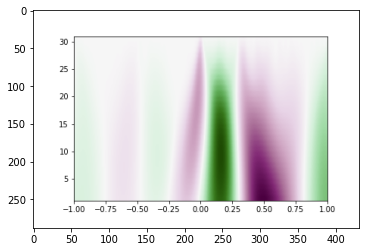

<class 'numpy.ndarray'>
I got here 1
I got here 2


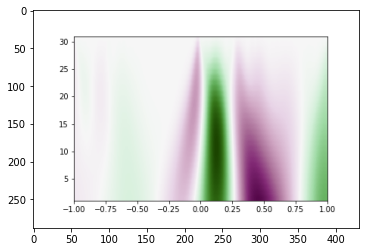

<class 'numpy.ndarray'>
I got here 1
I got here 2


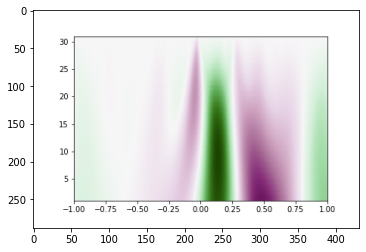

<class 'numpy.ndarray'>
I got here 1
I got here 2


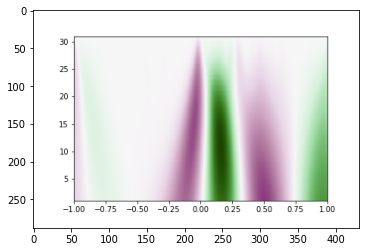

<class 'numpy.ndarray'>
I got here 1
I got here 2


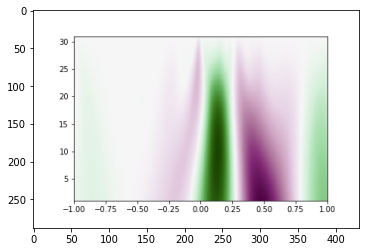

<class 'numpy.ndarray'>
I got here 1
I got here 2


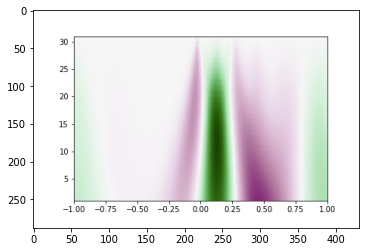

<class 'numpy.ndarray'>
I got here 1
I got here 2


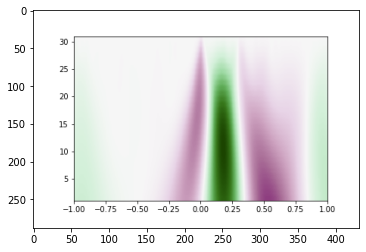

<class 'numpy.ndarray'>
I got here 1
I got here 2


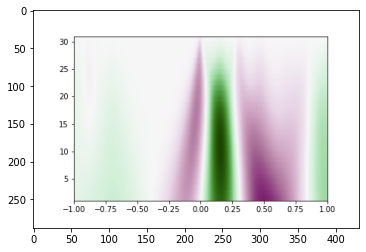

<class 'numpy.ndarray'>
I got here 1
I got here 2


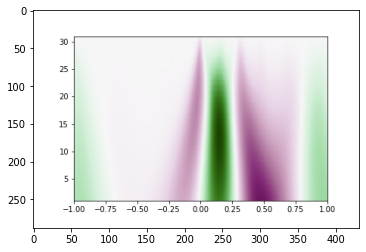

<class 'numpy.ndarray'>
I got here 1
I got here 2


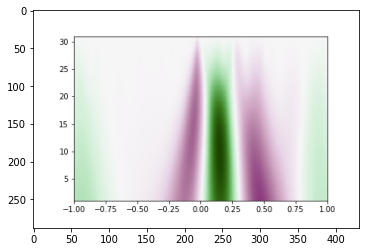

<class 'numpy.ndarray'>
I got here 1
I got here 2


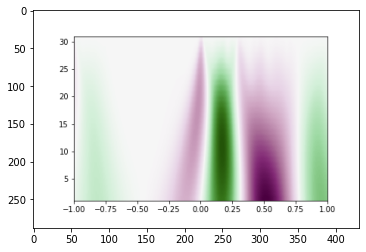

<class 'numpy.ndarray'>
I got here 1
I got here 2


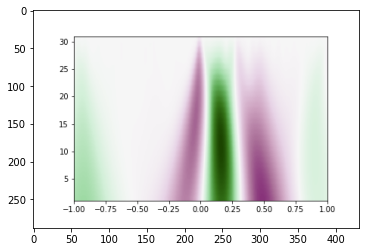

<class 'numpy.ndarray'>
I got here 1
I got here 2


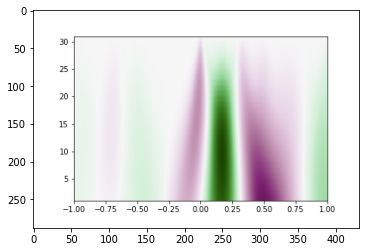

<class 'numpy.ndarray'>
I got here 1
I got here 2


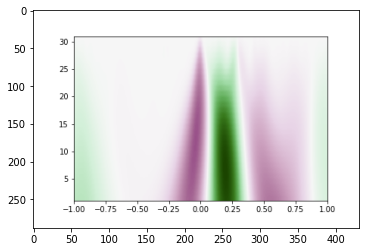

<class 'numpy.ndarray'>
I got here 1
I got here 2


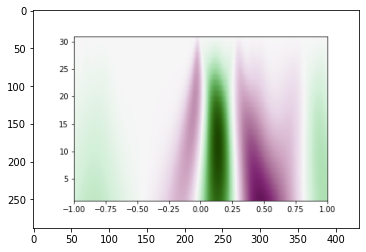

<class 'numpy.ndarray'>
I got here 1
I got here 2


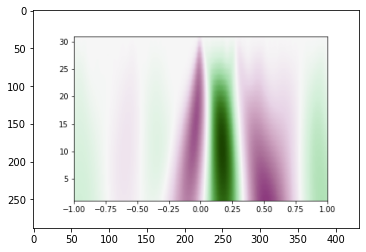

<class 'numpy.ndarray'>
I got here 1
I got here 2


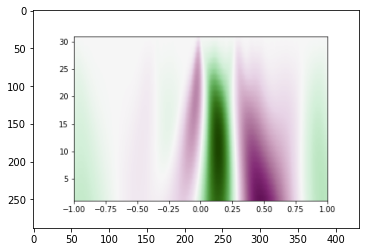

<class 'numpy.ndarray'>
I got here 1
I got here 2


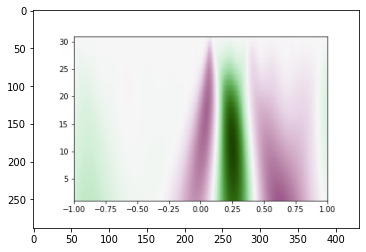

<class 'numpy.ndarray'>
I got here 1
I got here 2


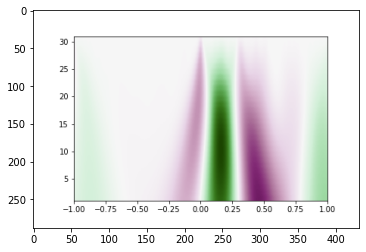

<class 'numpy.ndarray'>
I got here 1
I got here 2


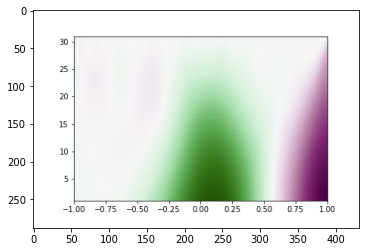

<class 'numpy.ndarray'>
I got here 1
I got here 2


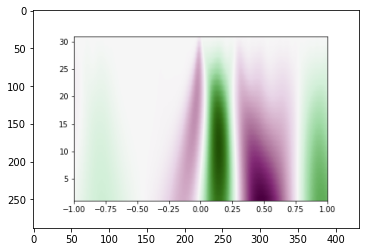

<class 'numpy.ndarray'>
I got here 1
I got here 2


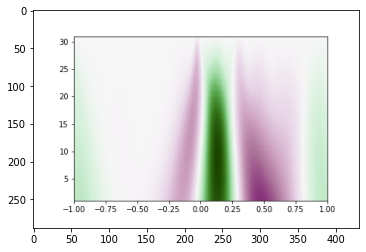

<class 'numpy.ndarray'>
I got here 1
I got here 2


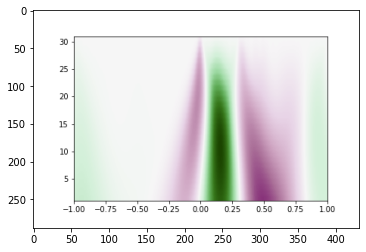

<class 'numpy.ndarray'>
I got here 1
I got here 2


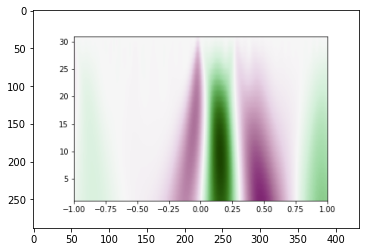

<class 'numpy.ndarray'>
I got here 1
I got here 2


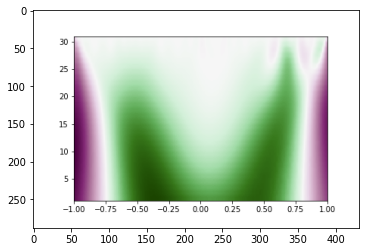

<class 'numpy.ndarray'>
I got here 1
I got here 2


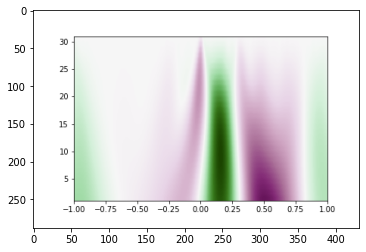

<class 'numpy.ndarray'>
I got here 1
I got here 2


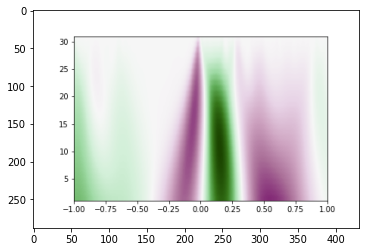

<class 'numpy.ndarray'>
I got here 1
I got here 2


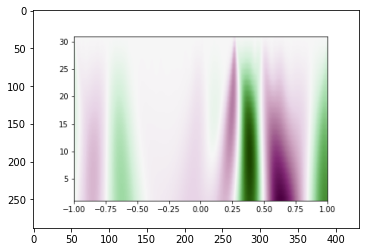

<class 'numpy.ndarray'>
I got here 1
I got here 2


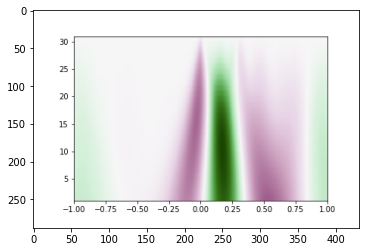

<class 'numpy.ndarray'>
I got here 1
I got here 2


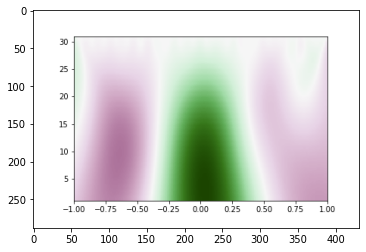

<class 'numpy.ndarray'>
I got here 1
I got here 2


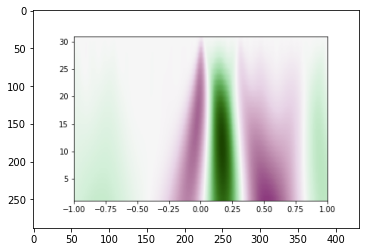

<class 'numpy.ndarray'>
I got here 1
I got here 2


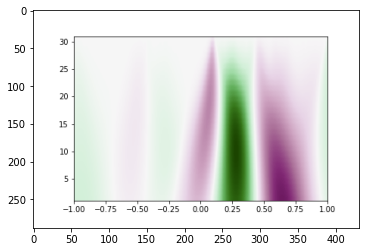

<class 'numpy.ndarray'>
I got here 1
I got here 2


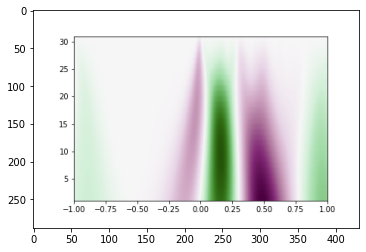

<class 'numpy.ndarray'>
I got here 1
I got here 2


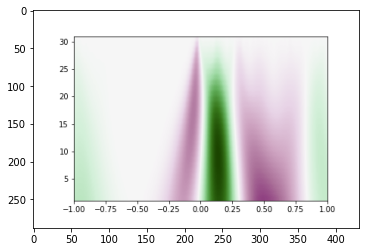

<class 'numpy.ndarray'>
I got here 1
I got here 2


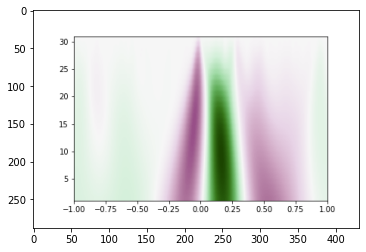

<class 'numpy.ndarray'>
I got here 1
I got here 2


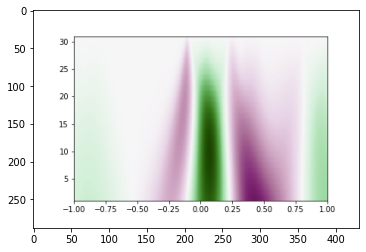

<class 'numpy.ndarray'>
I got here 1
I got here 2


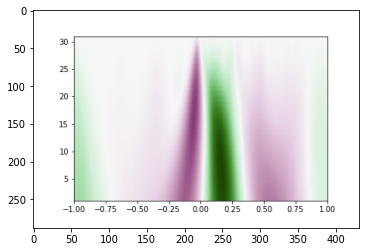

<class 'numpy.ndarray'>
I got here 1
I got here 2


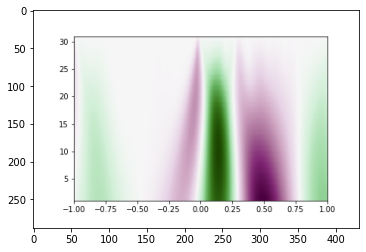

<class 'numpy.ndarray'>
I got here 1
I got here 2


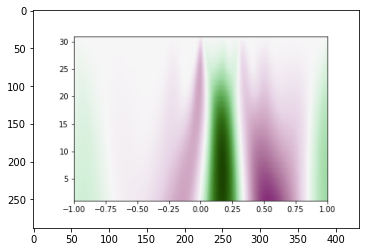

<class 'numpy.ndarray'>
I got here 1
I got here 2


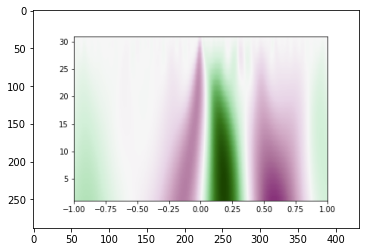

<class 'numpy.ndarray'>
I got here 1
I got here 2


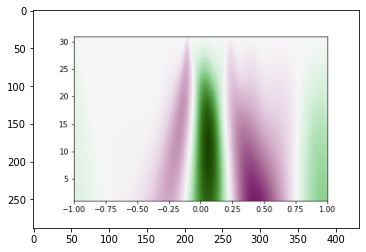

<class 'numpy.ndarray'>
I got here 1
I got here 2


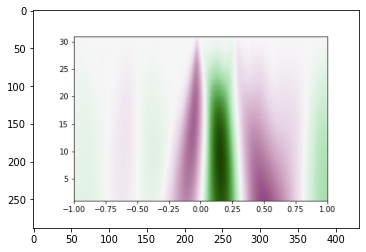

<class 'numpy.ndarray'>
I got here 1
I got here 2


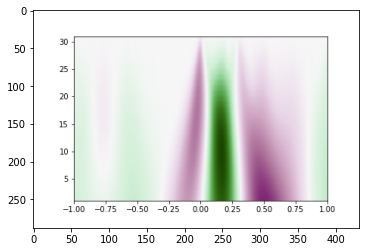

<class 'numpy.ndarray'>
I got here 1
I got here 2


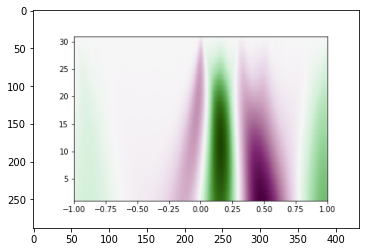

<class 'numpy.ndarray'>
I got here 1
I got here 2


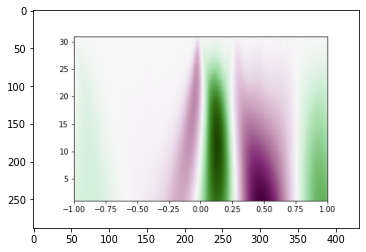

<class 'numpy.ndarray'>
I got here 1
I got here 2


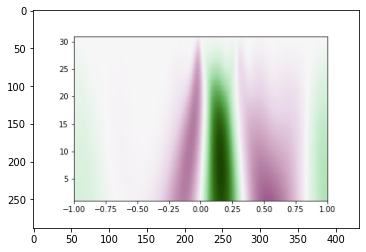

<class 'numpy.ndarray'>
I got here 1
I got here 2


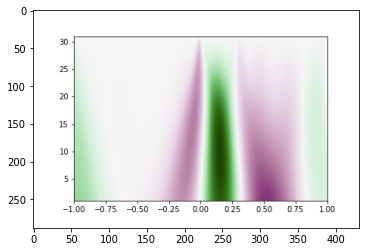

<class 'numpy.ndarray'>
I got here 1
I got here 2


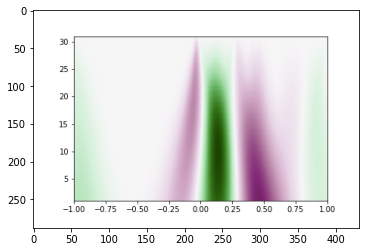

<class 'numpy.ndarray'>
I got here 1
I got here 2


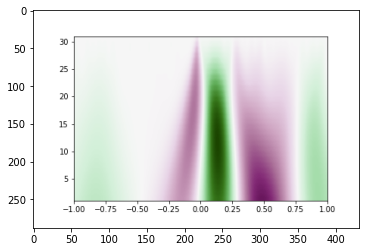

<class 'numpy.ndarray'>
I got here 1
I got here 2


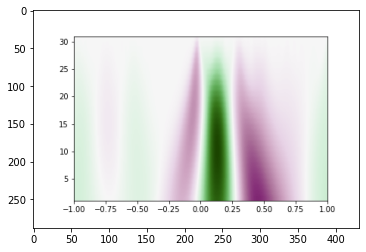

<class 'numpy.ndarray'>
I got here 1
I got here 2


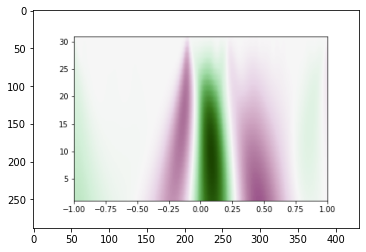

<class 'numpy.ndarray'>
I got here 1
I got here 2


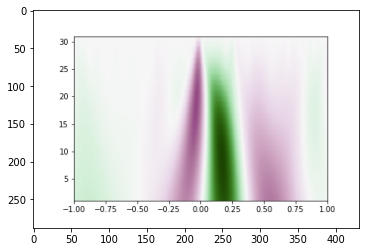

<class 'numpy.ndarray'>
I got here 1
I got here 2


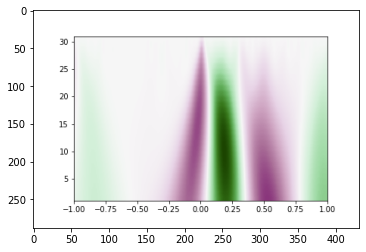

<class 'numpy.ndarray'>
I got here 1
I got here 2


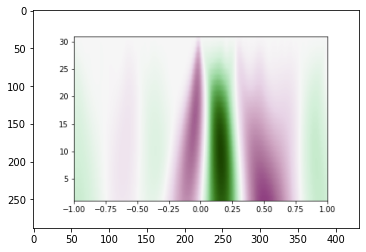

<class 'numpy.ndarray'>
I got here 1
I got here 2


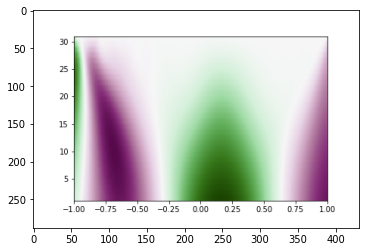

<class 'numpy.ndarray'>
I got here 1
I got here 2


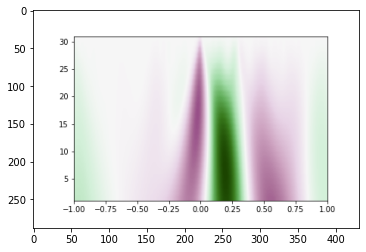

<class 'numpy.ndarray'>
I got here 1
I got here 2


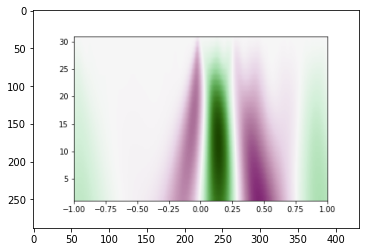

<class 'numpy.ndarray'>
I got here 1
I got here 2


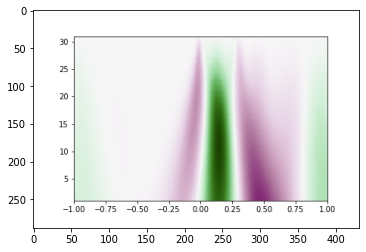

<class 'numpy.ndarray'>
I got here 1
I got here 2


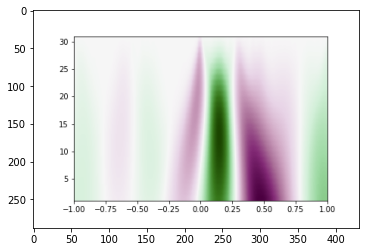

<class 'numpy.ndarray'>
I got here 1
I got here 2


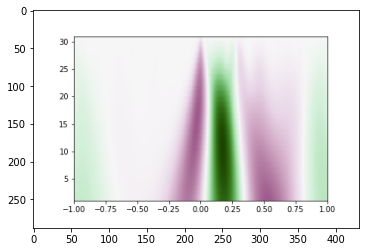

<class 'numpy.ndarray'>
I got here 1
I got here 2


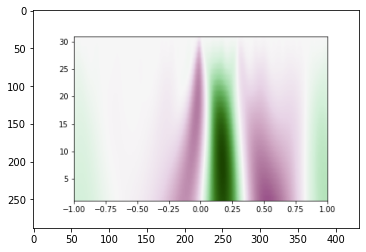

<class 'numpy.ndarray'>
I got here 1
I got here 2


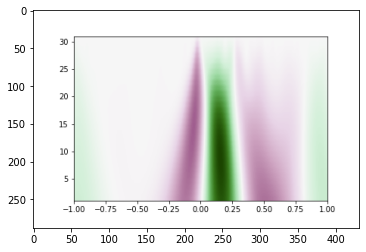

<class 'numpy.ndarray'>
I got here 1
I got here 2


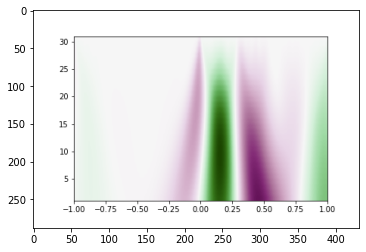

<class 'numpy.ndarray'>
I got here 1
I got here 2


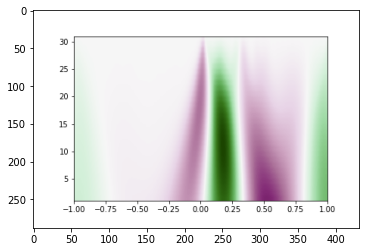

<class 'numpy.ndarray'>
I got here 1
I got here 2


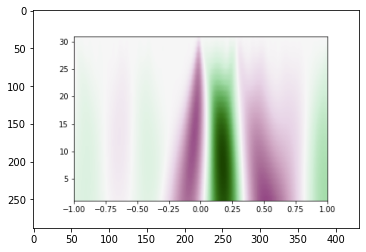

<class 'numpy.ndarray'>
I got here 1
I got here 2


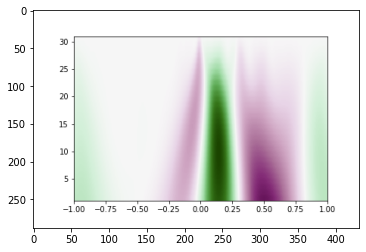

<class 'numpy.ndarray'>
I got here 1
I got here 2


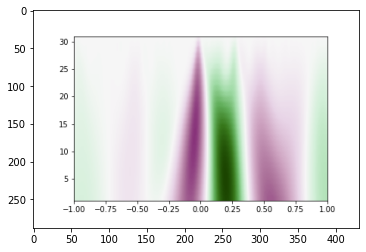

<class 'numpy.ndarray'>
I got here 1
I got here 2


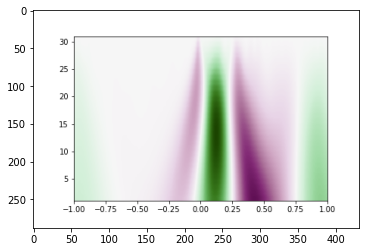

<class 'numpy.ndarray'>
I got here 1
I got here 2


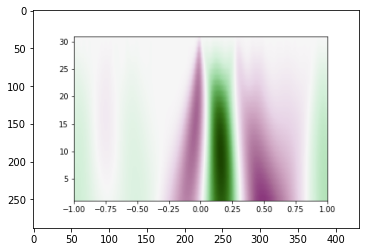

<class 'numpy.ndarray'>
I got here 1
I got here 2


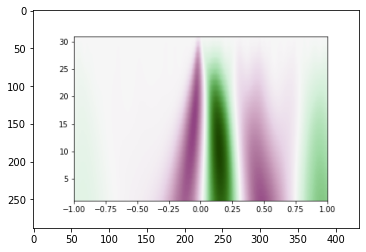

<class 'numpy.ndarray'>
I got here 1
I got here 2


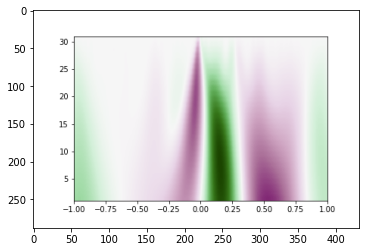

<class 'numpy.ndarray'>
I got here 1
I got here 2


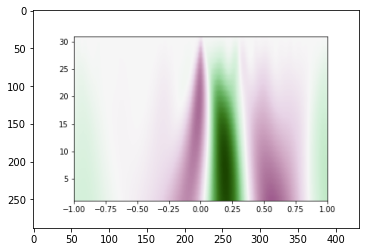

<class 'numpy.ndarray'>
I got here 1
I got here 2


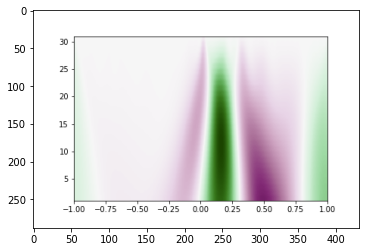

<class 'numpy.ndarray'>
I got here 1
I got here 2


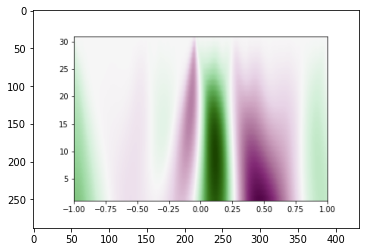

<class 'numpy.ndarray'>
I got here 1
I got here 2


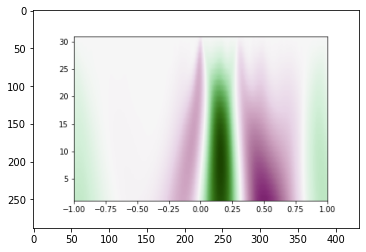

<class 'numpy.ndarray'>
I got here 1
I got here 2


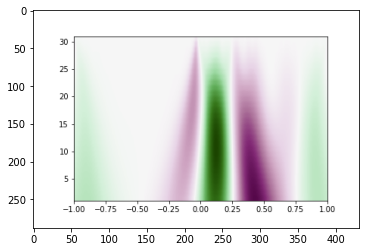

<class 'numpy.ndarray'>
I got here 1
I got here 2


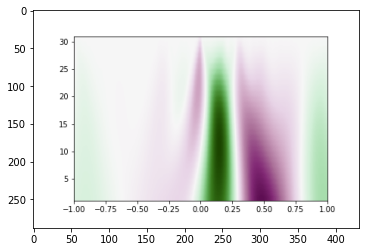

<class 'numpy.ndarray'>
I got here 1
I got here 2


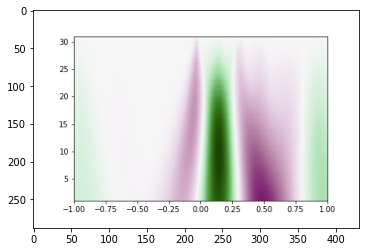

<class 'numpy.ndarray'>
I got here 1
I got here 2


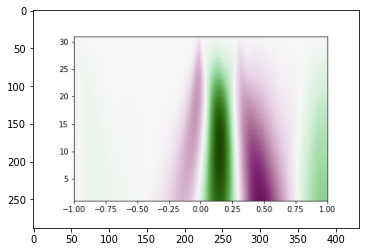

<class 'numpy.ndarray'>
I got here 1
I got here 2


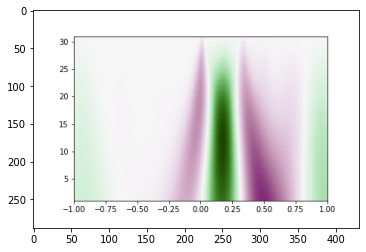

<class 'numpy.ndarray'>
I got here 1
I got here 2


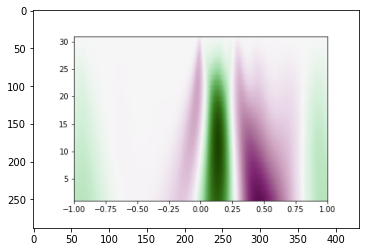

<class 'numpy.ndarray'>
I got here 1
I got here 2


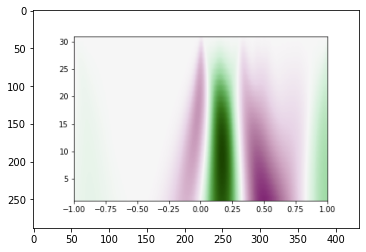

<class 'numpy.ndarray'>
I got here 1
I got here 2


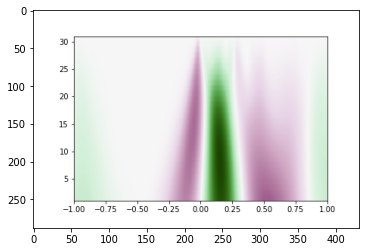

<class 'numpy.ndarray'>
I got here 1
I got here 2


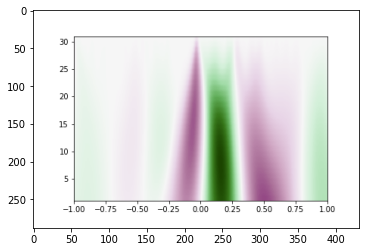

<class 'numpy.ndarray'>
I got here 1
I got here 2


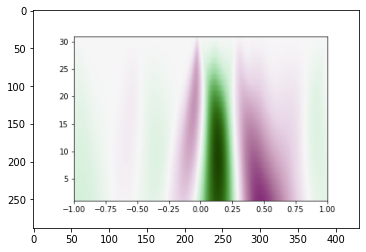

<class 'numpy.ndarray'>
I got here 1
I got here 2


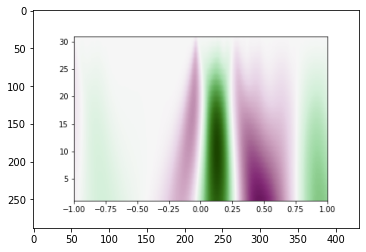

<class 'numpy.ndarray'>
I got here 1
I got here 2


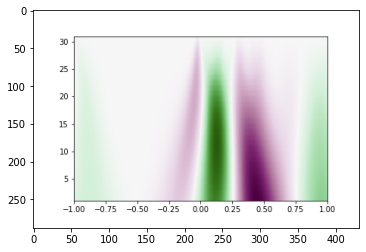

<class 'numpy.ndarray'>
I got here 1
I got here 2


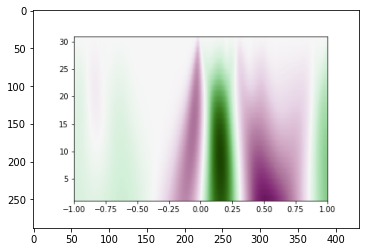

<class 'numpy.ndarray'>
I got here 1
I got here 2


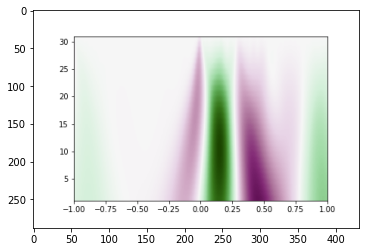

<class 'numpy.ndarray'>
I got here 1
I got here 2


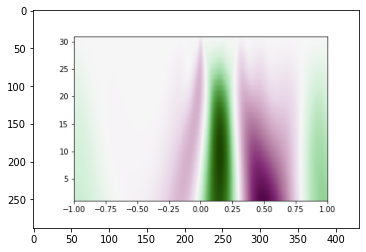

<class 'numpy.ndarray'>
I got here 1
I got here 2


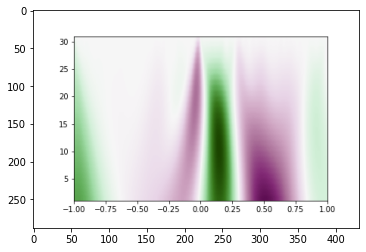

<class 'numpy.ndarray'>
I got here 1
I got here 2


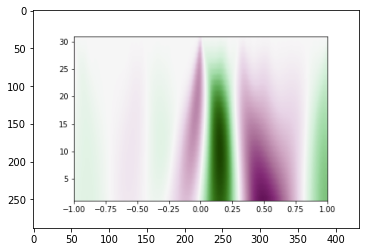

<class 'numpy.ndarray'>
I got here 1
I got here 2


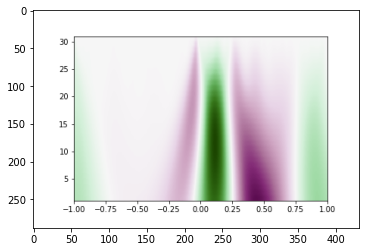

<class 'numpy.ndarray'>
I got here 1
I got here 2


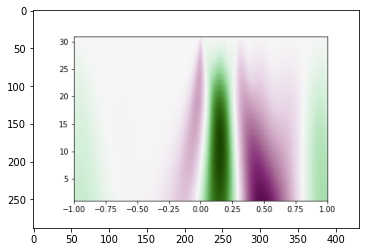

<class 'numpy.ndarray'>
I got here 1
I got here 2


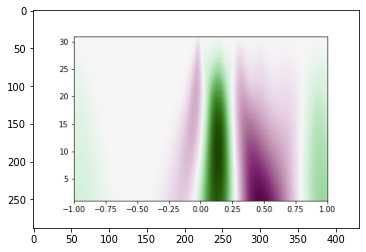

<class 'numpy.ndarray'>
I got here 1
I got here 2


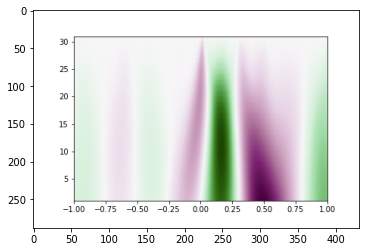

<class 'numpy.ndarray'>
I got here 1
I got here 2


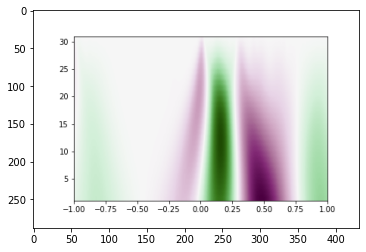

<class 'numpy.ndarray'>
I got here 1
I got here 2


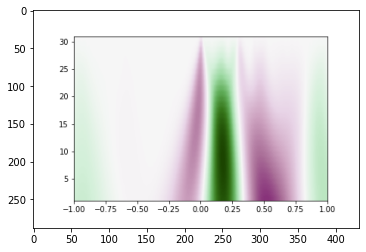

<class 'numpy.ndarray'>
I got here 1
I got here 2


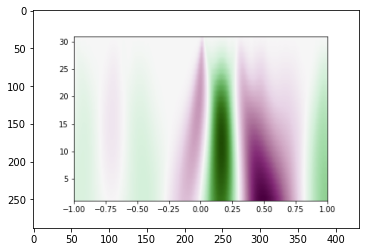

<class 'numpy.ndarray'>
I got here 1
I got here 2


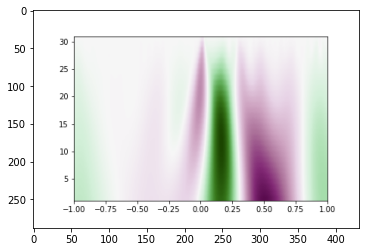

<class 'numpy.ndarray'>
I got here 1
I got here 2


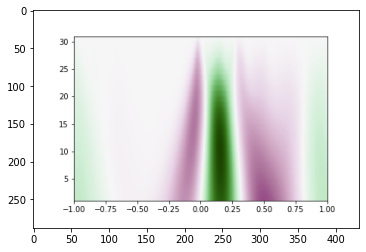

<class 'numpy.ndarray'>
I got here 1
I got here 2


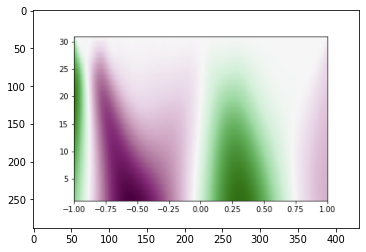

<class 'numpy.ndarray'>
I got here 1
I got here 2


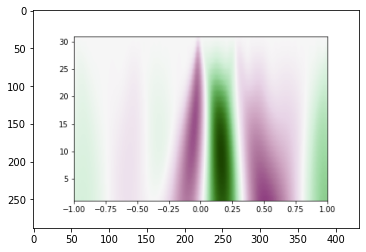

<class 'numpy.ndarray'>
I got here 1
I got here 2


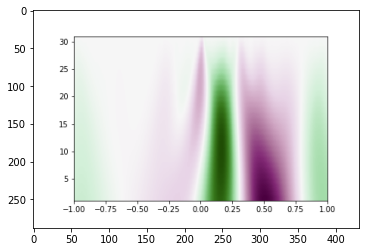

<class 'numpy.ndarray'>
I got here 1
I got here 2


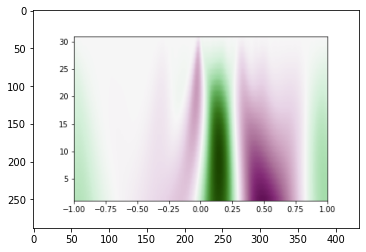

<class 'numpy.ndarray'>
I got here 1
I got here 2


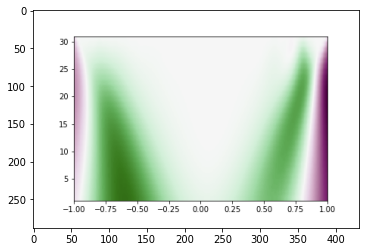

<class 'numpy.ndarray'>
I got here 1
I got here 2


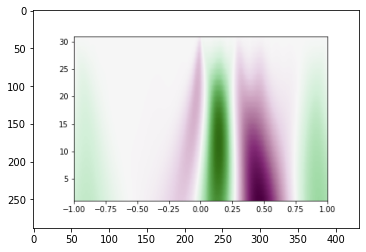

<class 'numpy.ndarray'>
I got here 1
I got here 2


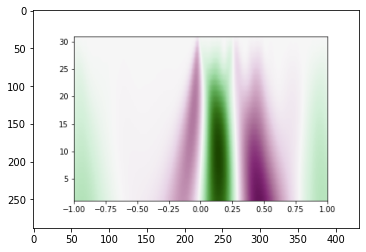

<class 'numpy.ndarray'>
I got here 1
I got here 2


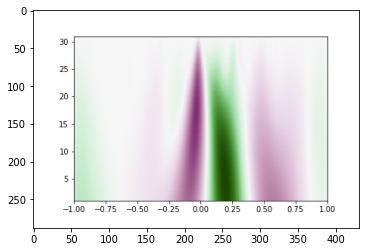

<class 'numpy.ndarray'>
I got here 1
I got here 2


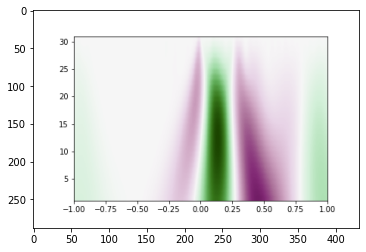

<class 'numpy.ndarray'>
I got here 1
I got here 2


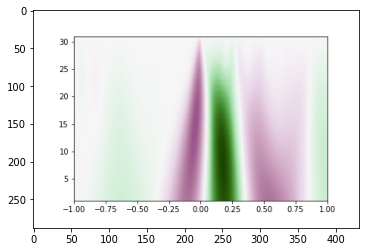

<class 'numpy.ndarray'>
I got here 1
I got here 2


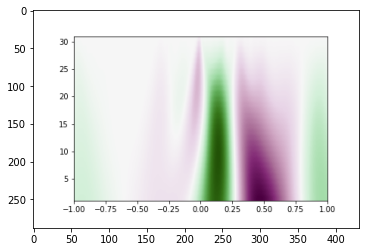

<class 'numpy.ndarray'>
I got here 1
I got here 2


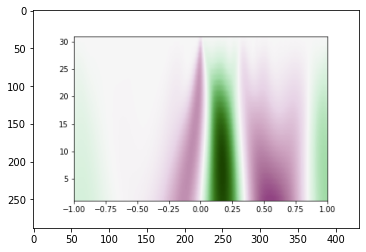

<class 'numpy.ndarray'>
I got here 1
I got here 2


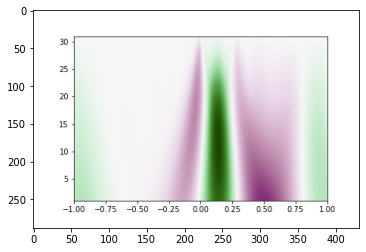

<class 'numpy.ndarray'>
I got here 1
I got here 2


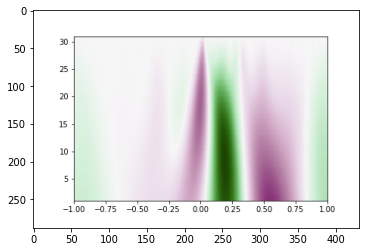

<class 'numpy.ndarray'>
I got here 1
I got here 2


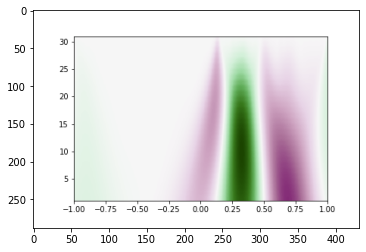

<class 'numpy.ndarray'>
I got here 1
I got here 2


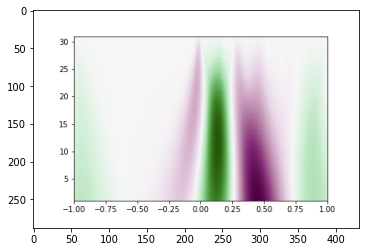

<class 'numpy.ndarray'>
I got here 1
I got here 2


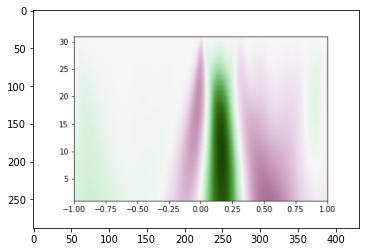

<class 'numpy.ndarray'>
I got here 1
I got here 2


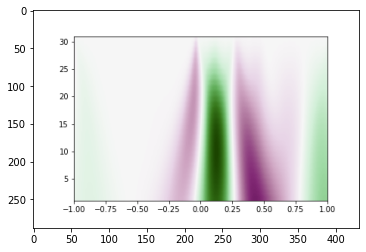

<class 'numpy.ndarray'>
I got here 1
I got here 2


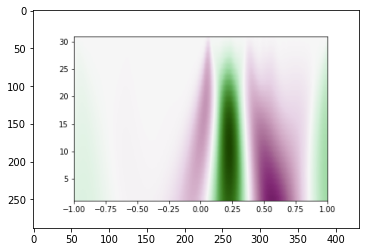

<class 'numpy.ndarray'>
I got here 1
I got here 2


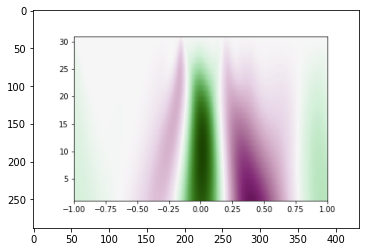

<class 'numpy.ndarray'>
I got here 1
I got here 2


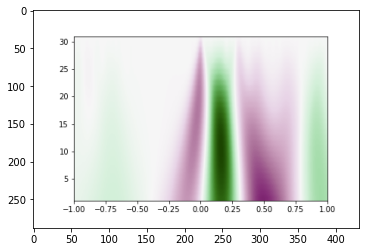

<class 'numpy.ndarray'>
I got here 1
I got here 2


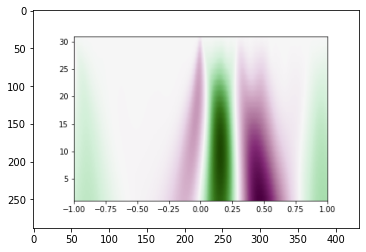

<class 'numpy.ndarray'>
I got here 1
I got here 2


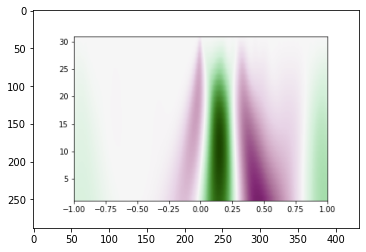

<class 'numpy.ndarray'>
I got here 1
I got here 2


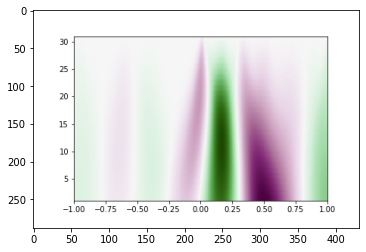

<class 'numpy.ndarray'>
I got here 1
I got here 2


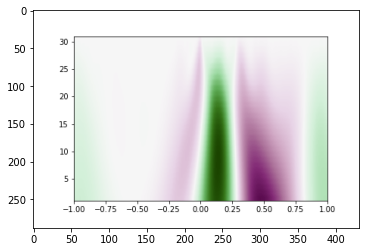

<class 'numpy.ndarray'>
I got here 1
I got here 2


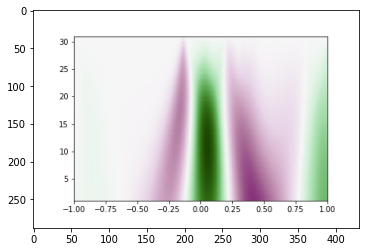

<class 'numpy.ndarray'>
I got here 1
I got here 2


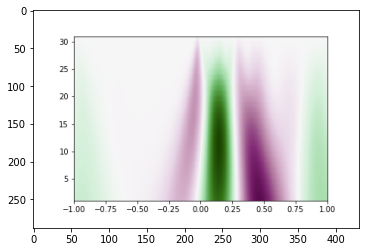

<class 'numpy.ndarray'>
I got here 1
I got here 2


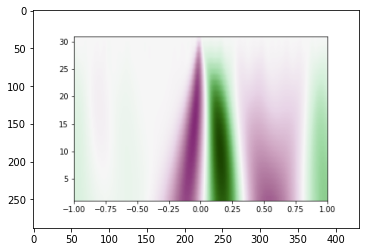

<class 'numpy.ndarray'>
I got here 1
I got here 2


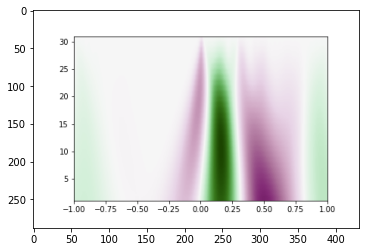

<class 'numpy.ndarray'>
I got here 1
I got here 2


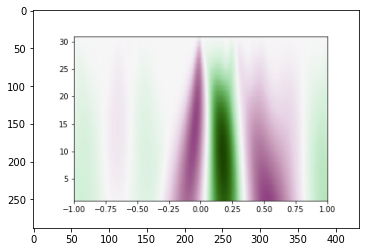

<class 'numpy.ndarray'>
I got here 1
I got here 2


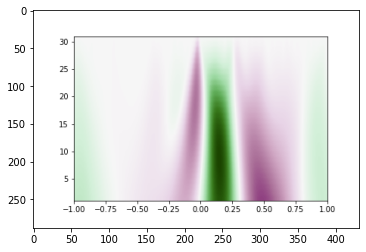

<class 'numpy.ndarray'>
I got here 1
I got here 2


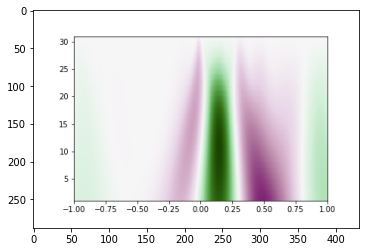

<class 'numpy.ndarray'>
I got here 1
I got here 2


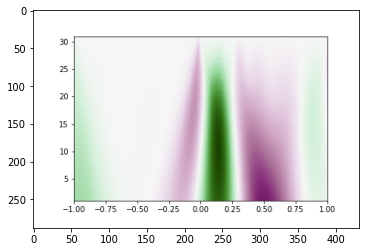

<class 'numpy.ndarray'>
I got here 1
I got here 2


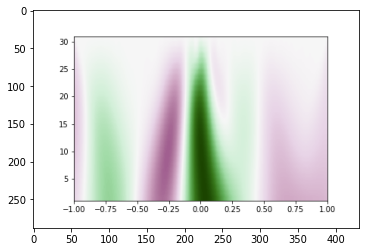

<class 'numpy.ndarray'>
I got here 1
I got here 2


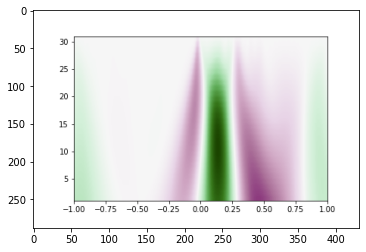

<class 'numpy.ndarray'>
I got here 1
I got here 2


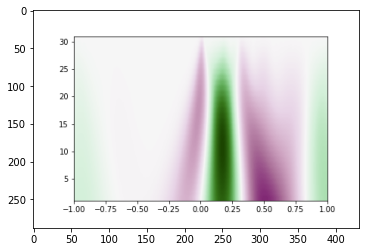

<class 'numpy.ndarray'>
I got here 1
I got here 2


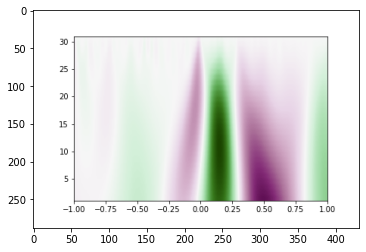

<class 'numpy.ndarray'>
I got here 1
I got here 2


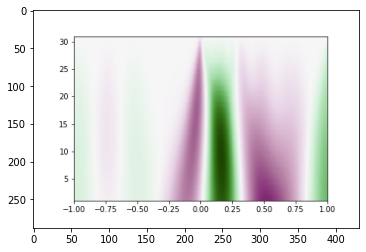

<class 'numpy.ndarray'>
I got here 1
I got here 2


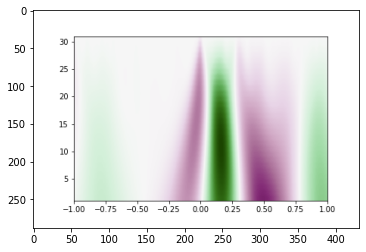

<class 'numpy.ndarray'>
I got here 1
I got here 2


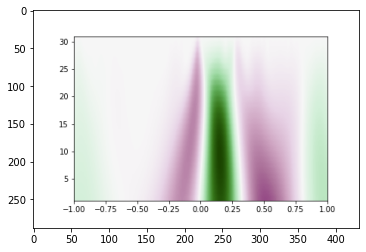

<class 'numpy.ndarray'>
I got here 1
I got here 2


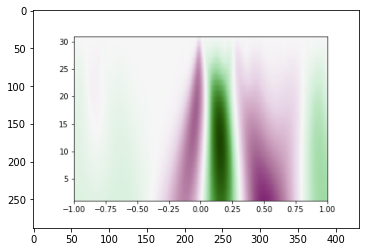

<class 'numpy.ndarray'>
I got here 1
I got here 2


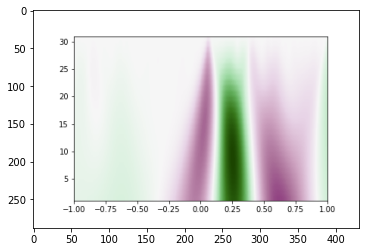

<class 'numpy.ndarray'>
I got here 1
I got here 2


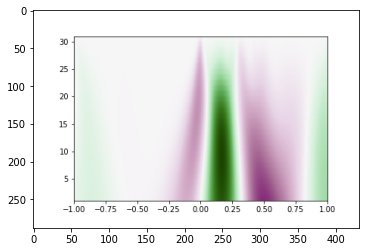

<class 'numpy.ndarray'>
I got here 1
I got here 2


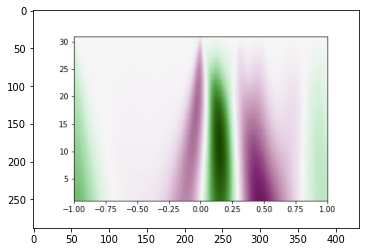

<class 'numpy.ndarray'>
I got here 1
I got here 2


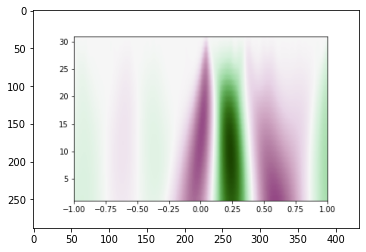

<class 'numpy.ndarray'>
I got here 1
I got here 2


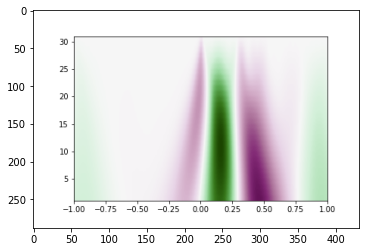

<class 'numpy.ndarray'>
I got here 1
I got here 2


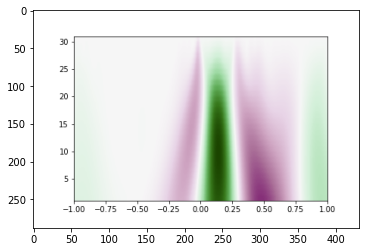

<class 'numpy.ndarray'>
I got here 1
I got here 2


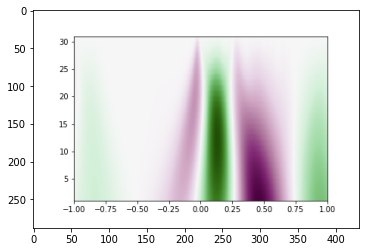

<class 'numpy.ndarray'>
I got here 1
I got here 2


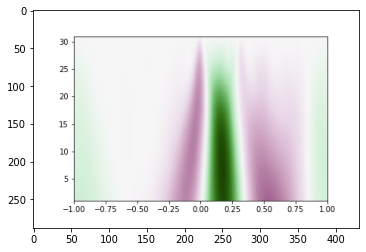

<class 'numpy.ndarray'>
I got here 1
I got here 2


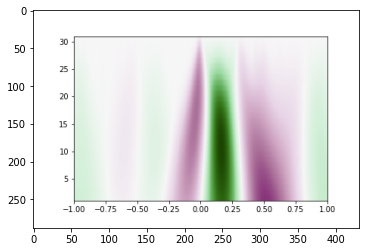

<class 'numpy.ndarray'>
I got here 1
I got here 2


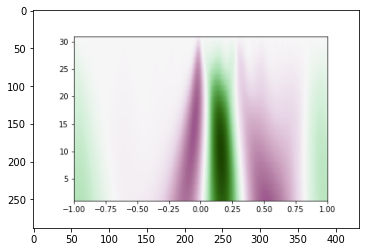

<class 'numpy.ndarray'>
I got here 1
I got here 2


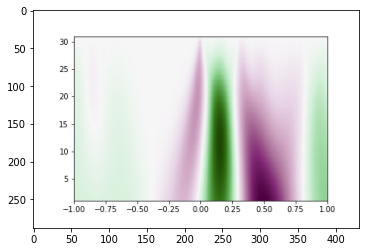

<class 'numpy.ndarray'>
I got here 1
I got here 2


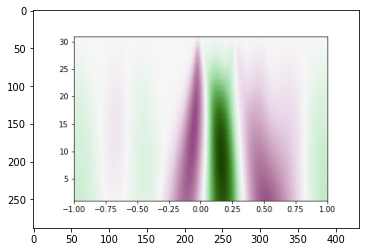

<class 'numpy.ndarray'>
I got here 1
I got here 2


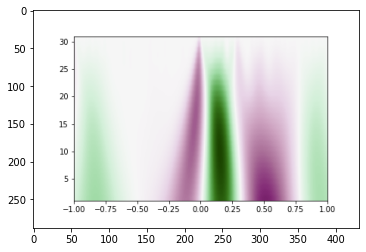

<class 'numpy.ndarray'>
I got here 1
I got here 2


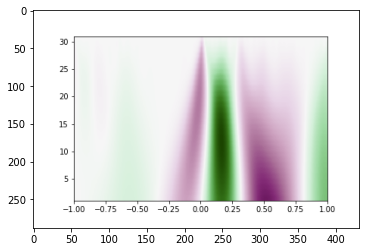

<class 'numpy.ndarray'>
I got here 1
I got here 2


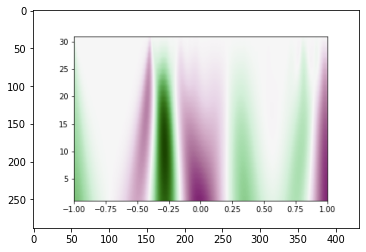

<class 'numpy.ndarray'>
I got here 1
I got here 2


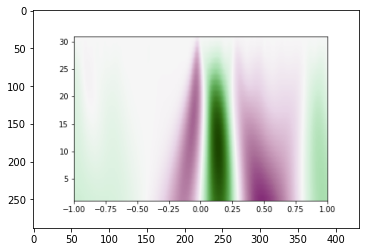

<class 'numpy.ndarray'>
I got here 1
I got here 2


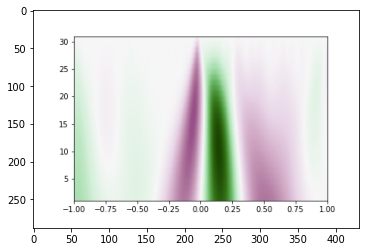

<class 'numpy.ndarray'>
I got here 1
I got here 2


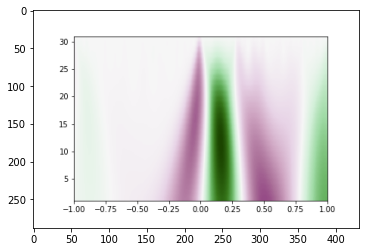

<class 'numpy.ndarray'>
I got here 1
I got here 2


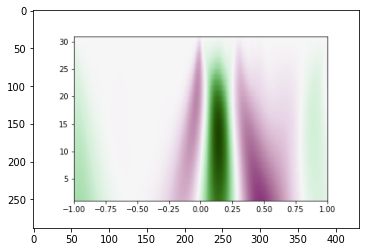

<class 'numpy.ndarray'>
I got here 1
I got here 2


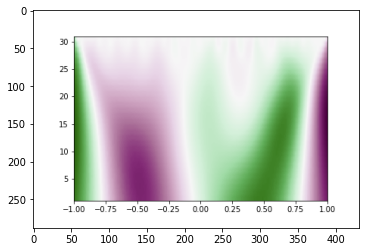

<class 'numpy.ndarray'>
I got here 1
I got here 2


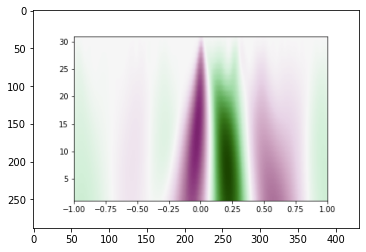

<class 'numpy.ndarray'>
I got here 1
I got here 2


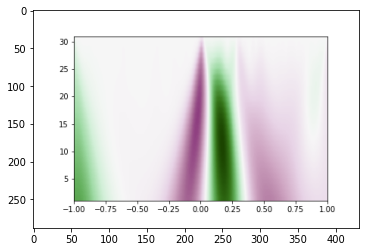

<class 'numpy.ndarray'>
I got here 1
I got here 2


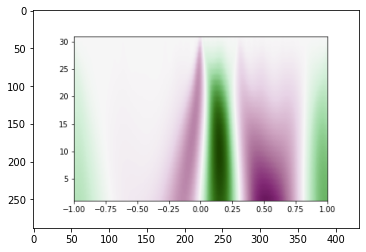

<class 'numpy.ndarray'>
I got here 1
I got here 2


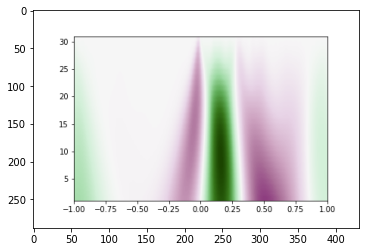

<class 'numpy.ndarray'>
I got here 1
I got here 2


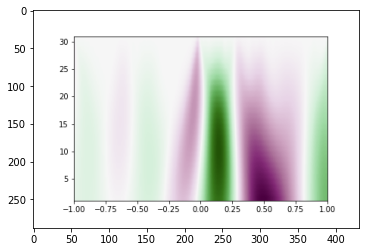

<class 'numpy.ndarray'>
I got here 1
I got here 2


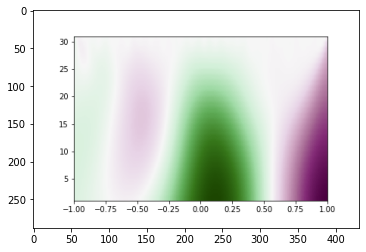

<class 'numpy.ndarray'>
I got here 1
I got here 2


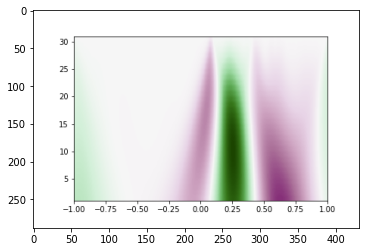

<class 'numpy.ndarray'>
I got here 1
I got here 2


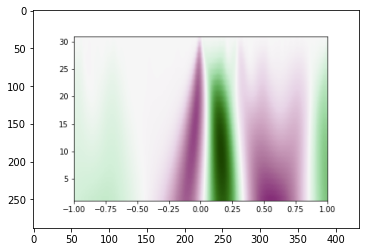

<class 'numpy.ndarray'>
I got here 1
I got here 2


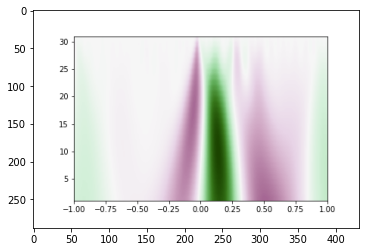

<class 'numpy.ndarray'>
I got here 1
I got here 2


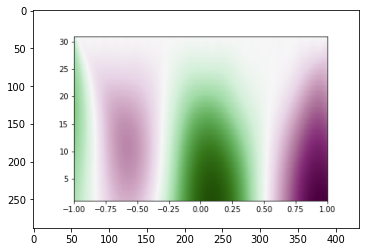

<class 'numpy.ndarray'>
I got here 1
I got here 2


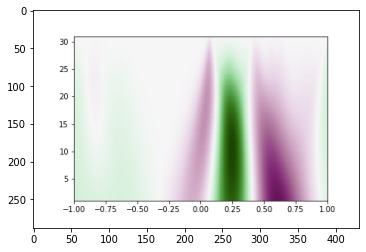

<class 'numpy.ndarray'>
I got here 1
I got here 2


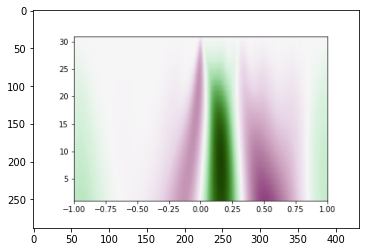

<class 'numpy.ndarray'>
I got here 1
I got here 2


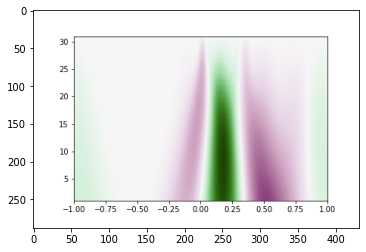

<class 'numpy.ndarray'>
I got here 1
I got here 2


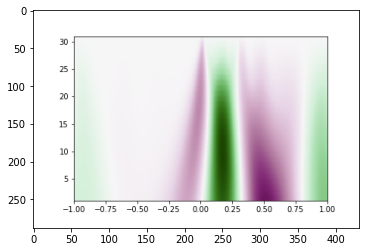

<class 'numpy.ndarray'>
I got here 1
I got here 2


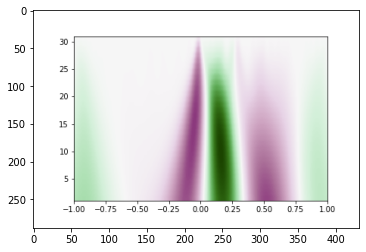

<class 'numpy.ndarray'>
I got here 1
I got here 2


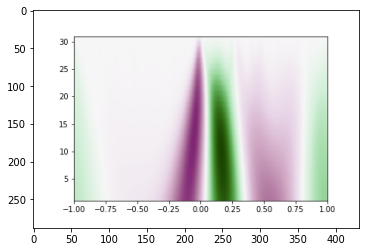

<class 'numpy.ndarray'>
I got here 1
I got here 2


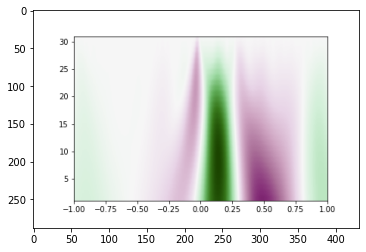

<class 'numpy.ndarray'>
I got here 1
I got here 2


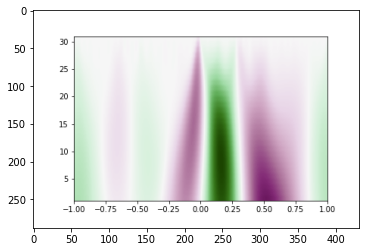

<class 'numpy.ndarray'>
I got here 1
I got here 2


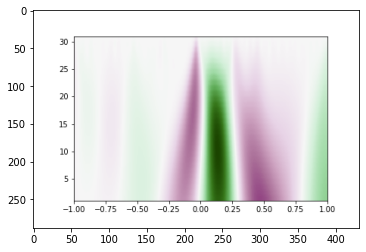

<class 'numpy.ndarray'>
I got here 1
I got here 2


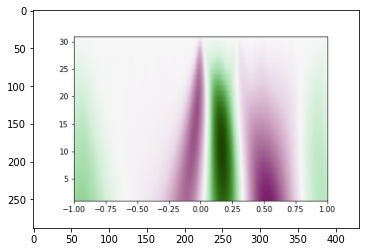

<class 'numpy.ndarray'>
I got here 1
I got here 2


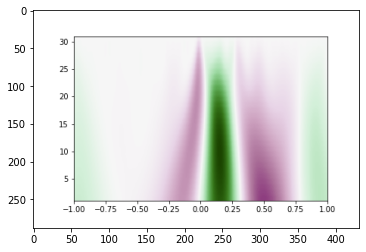

<class 'numpy.ndarray'>
I got here 1
I got here 2


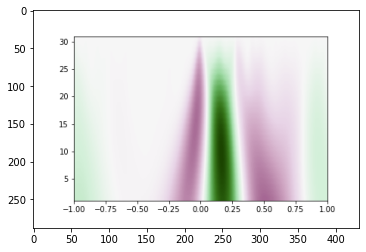

<class 'numpy.ndarray'>
I got here 1
I got here 2


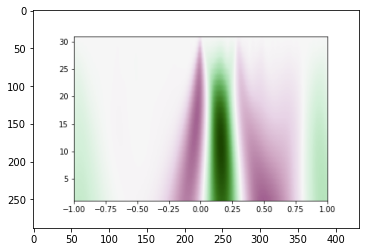

<class 'numpy.ndarray'>
I got here 1
I got here 2


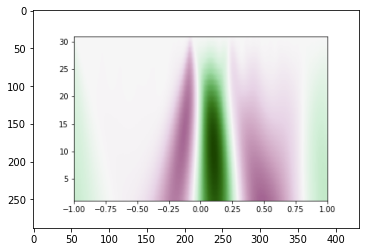

<class 'numpy.ndarray'>
I got here 1
I got here 2


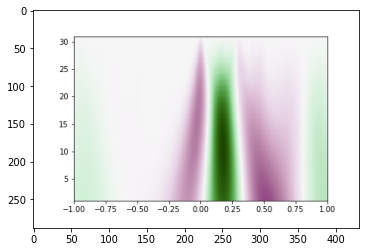

<class 'numpy.ndarray'>
I got here 1
I got here 2


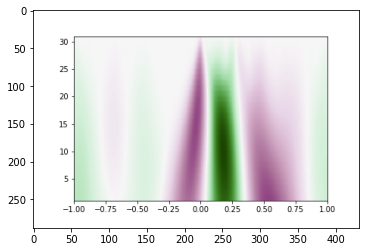

<class 'numpy.ndarray'>
I got here 1
I got here 2


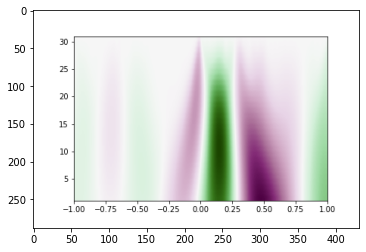

<class 'numpy.ndarray'>
I got here 1
I got here 2


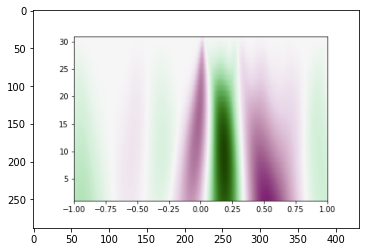

<class 'numpy.ndarray'>
I got here 1
I got here 2


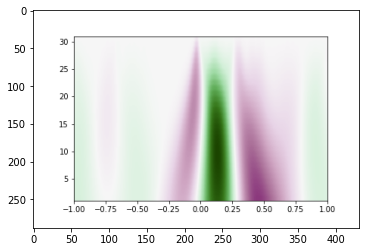

<class 'numpy.ndarray'>
I got here 1
I got here 2


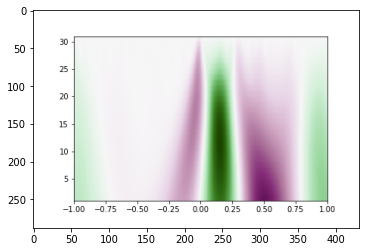

<class 'numpy.ndarray'>
I got here 1
I got here 2


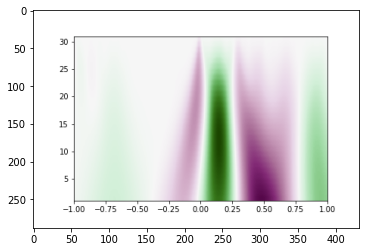

<class 'numpy.ndarray'>
I got here 1
I got here 2


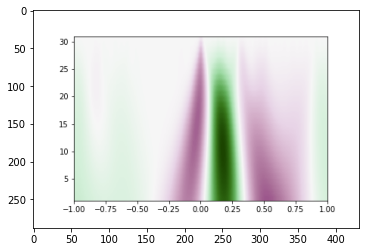

<class 'numpy.ndarray'>
I got here 1
I got here 2


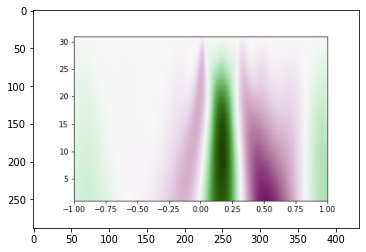

<class 'numpy.ndarray'>
I got here 1
I got here 2


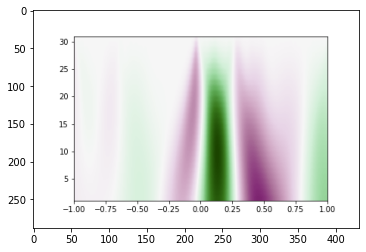

<class 'numpy.ndarray'>
I got here 1
I got here 2


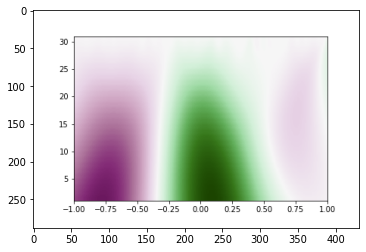

<class 'numpy.ndarray'>
I got here 1
I got here 2


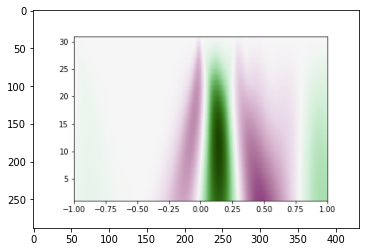

<class 'numpy.ndarray'>
I got here 1
I got here 2


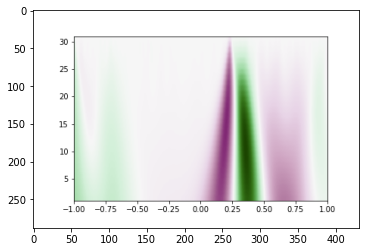

<class 'numpy.ndarray'>
I got here 1
I got here 2


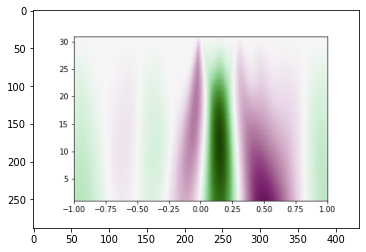

<class 'numpy.ndarray'>
I got here 1
I got here 2


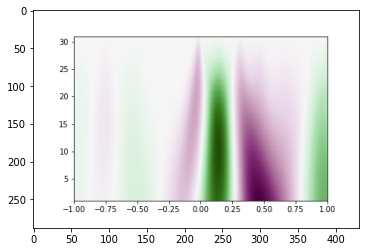

<class 'numpy.ndarray'>
I got here 1
I got here 2


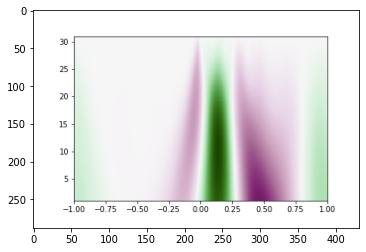

<class 'numpy.ndarray'>
I got here 1
I got here 2


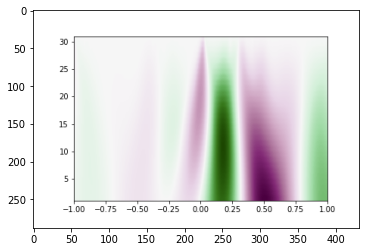

<class 'numpy.ndarray'>
I got here 1
I got here 2


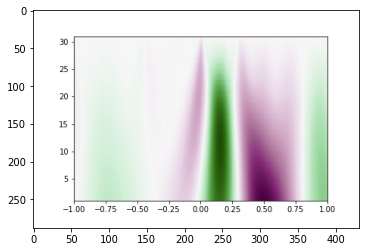

<class 'numpy.ndarray'>
I got here 1
I got here 2


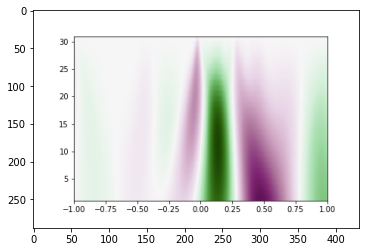

<class 'numpy.ndarray'>
I got here 1
I got here 2


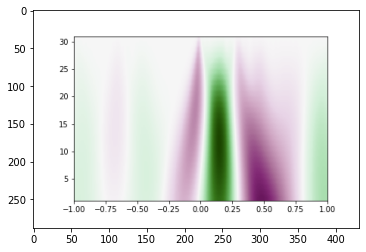

<class 'numpy.ndarray'>
I got here 1
I got here 2


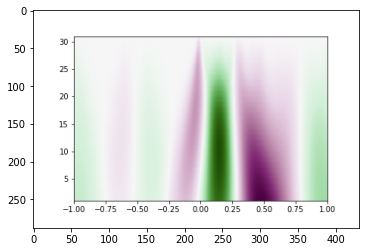

<class 'numpy.ndarray'>
I got here 1
I got here 2


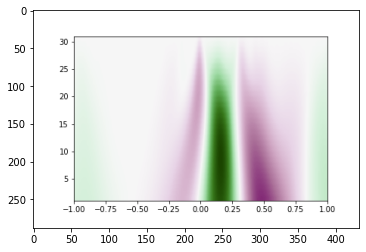

<class 'numpy.ndarray'>
I got here 1
I got here 2


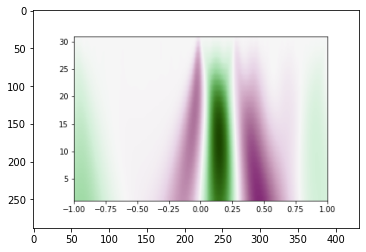

<class 'numpy.ndarray'>
I got here 1
I got here 2


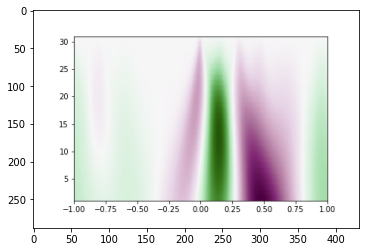

<class 'numpy.ndarray'>
I got here 1
I got here 2


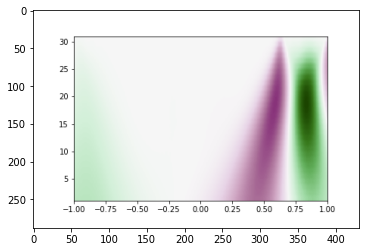

<class 'numpy.ndarray'>
I got here 1
I got here 2


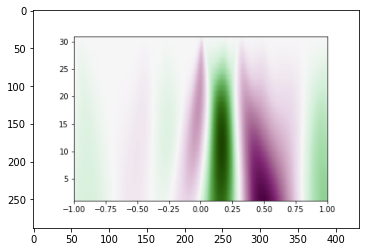

<class 'numpy.ndarray'>
I got here 1
I got here 2


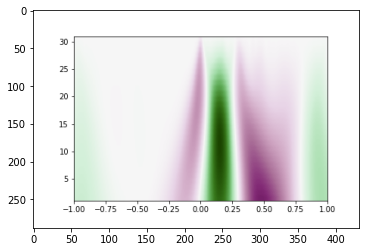

<class 'numpy.ndarray'>
I got here 1
I got here 2


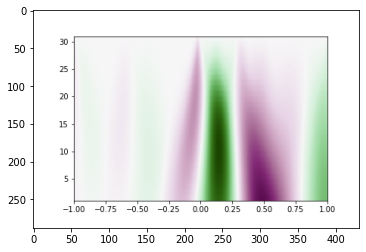

<class 'numpy.ndarray'>
I got here 1
I got here 2


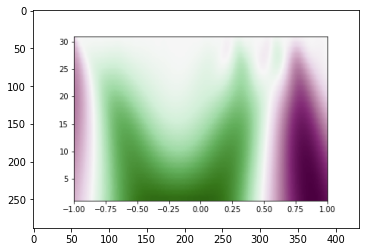

<class 'numpy.ndarray'>
I got here 1
I got here 2


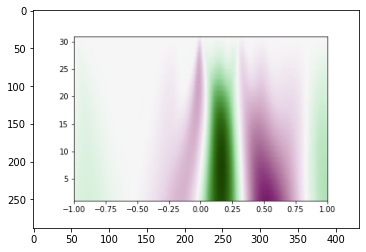

<class 'numpy.ndarray'>
I got here 1
I got here 2


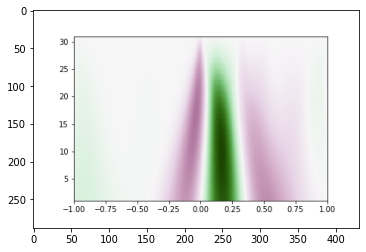

<class 'numpy.ndarray'>
I got here 1
I got here 2


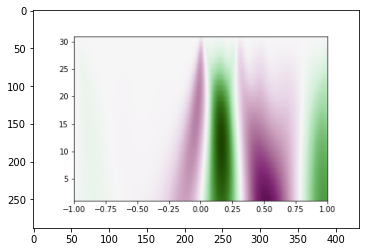

<class 'numpy.ndarray'>
I got here 1
I got here 2


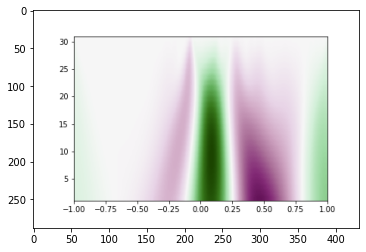

<class 'numpy.ndarray'>
I got here 1
I got here 2


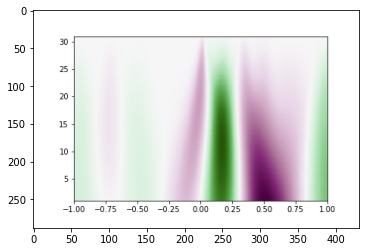

<class 'numpy.ndarray'>
I got here 1
I got here 2


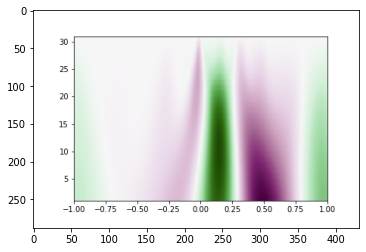

<class 'numpy.ndarray'>
I got here 1
I got here 2


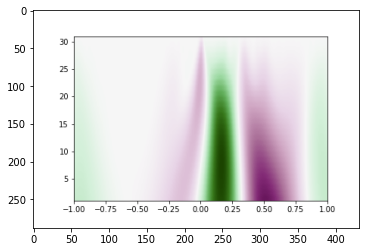

<class 'numpy.ndarray'>
I got here 1
I got here 2


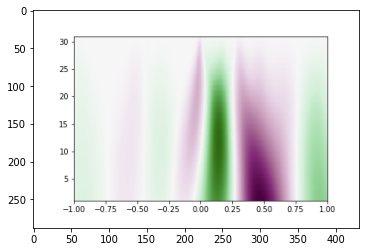

<class 'numpy.ndarray'>
I got here 1
I got here 2


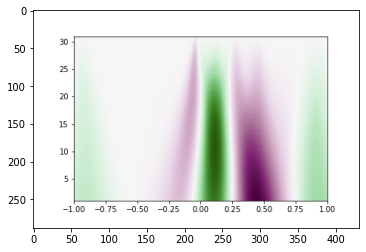

<class 'numpy.ndarray'>
I got here 1
I got here 2


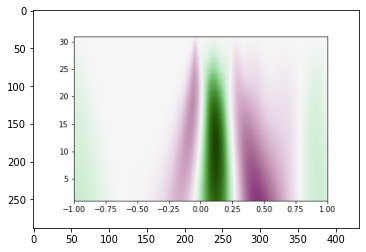

<class 'numpy.ndarray'>
I got here 1
I got here 2


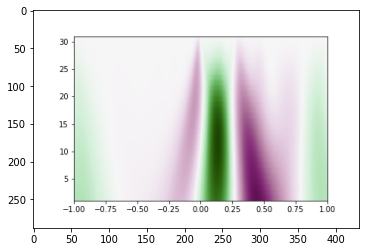

<class 'numpy.ndarray'>
I got here 1
I got here 2


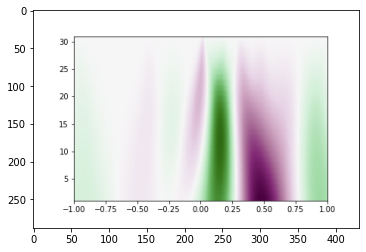

<class 'numpy.ndarray'>
I got here 1
I got here 2


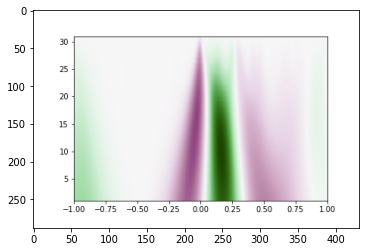

<class 'numpy.ndarray'>
I got here 1
I got here 2


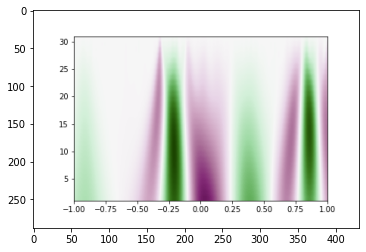

<class 'numpy.ndarray'>
I got here 1
I got here 2


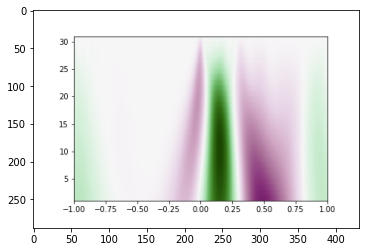

<class 'numpy.ndarray'>
I got here 1
I got here 2


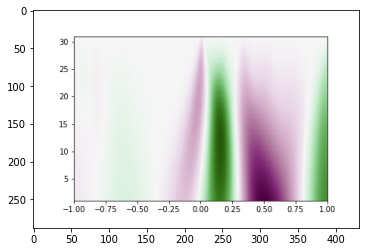

<class 'numpy.ndarray'>
I got here 1
I got here 2


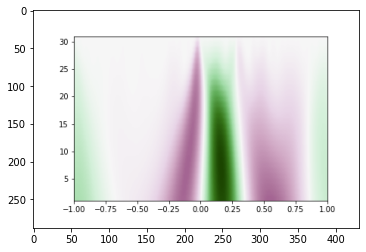

<class 'numpy.ndarray'>
I got here 1
I got here 2


In [0]:
data = load_data(number_of_items=1)

In [0]:
#--------------------------------------Model creation begins---------------------------------------

In [0]:
print(data['scalogram'][5])
print(len(data['scalogram'][5]))
print(type(data['scalogram'][5]))

[-0.37  -0.365 -0.38  ... -0.265 -0.26  -0.295]
648639
<class 'numpy.ndarray'>


In [0]:
pip install ecg_plot

In [0]:
#ecg_plot.plot(data['segments'][5],sample_rate = 360)

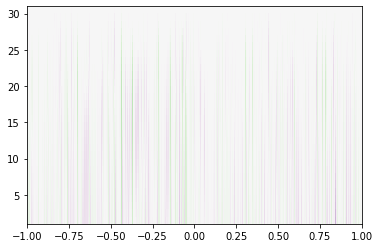

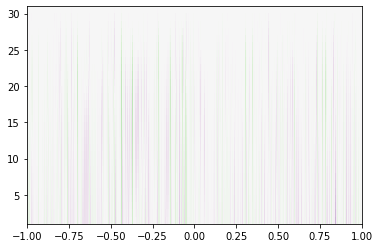

In [0]:
#----------------------------FOR REFERENCE ONLY-----------
widths = np.arange(1, 31)
im1=data['segments'][5]
cwtmatr, freqs = pywt.cwt(im1, widths, 'mexh')
plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  # doctest: +SKIP
plt.show() # doctest: +SKIP


cwtmatr1 = signal.cwt(im1, signal.ricker, widths)
plt.imshow(cwtmatr1, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  # doctest: +SKIP
plt.show() # doctest: +SKIP